In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap 
from sklearn.model_selection import train_test_split, StratifiedKFold
from lightgbm import LGBMClassifier

In [2]:
df = pd.read_csv('C:/Users/aksha/employee_attrition_project/HR_Attrition_dataset.csv')

In [3]:
pd.set_option('display.max_columns', None)

In [4]:
df.head()

,Employee_ID,Age,Attrition,Business_Travel,Department,Distance_From_Home,Education,Environment_Satisfaction,Gender,Salary,Job_Involvement,Job_Level,Job_Role,Job_Satisfaction,Marital_Status,Number_of_Companies_Worked_previously,Overtime,Salary_Hike_in_percent,Total_working_years_experience,Work_life_balance,No_of_years_worked_at_current_company,No_of_years_in_current_role,Years_since_last_promotion
0,1,56,Yes,Travel Rarely,Network Administration,24,Graduation,5,Male,186630,2,6,Manager,4,Married,7,Yes,85,9,1,7,2,4
1,2,46,Yes,Travel Rarely,Software Development,45,Degree,5,Male,78553,4,5,Help Desk,2,Divorced,3,No,22,18,4,1,2,0
2,3,32,No,No Travel,Data Science,30,Master's,3,Female,175003,1,4,HR,2,Single,2,Yes,100,0,4,5,5,8
3,4,60,Yes,Travel Frequently,Data Science,42,Graduation,2,Female,100795,2,8,Help Desk,3,Married,5,No,72,17,2,1,7,3
4,5,25,No,No Travel,Network Administration,26,Graduation,4,Female,75256,1,2,Director,4,Single,9,No,21,12,5,7,2,4


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 23 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   Employee_ID                            10000 non-null  int64 
 1   Age                                    10000 non-null  int64 
 2   Attrition                              10000 non-null  object
 3   Business_Travel                        10000 non-null  object
 4   Department                             10000 non-null  object
 5   Distance_From_Home                     10000 non-null  int64 
 6   Education                              10000 non-null  object
 7   Environment_Satisfaction               10000 non-null  int64 
 8   Gender                                 10000 non-null  object
 9   Salary                                 10000 non-null  int64 
 10  Job_Involvement                        10000 non-null  int64 
 11  Job_Level       

In [6]:
df.isna().sum()

Employee_ID                              0
Age                                      0
Attrition                                0
Business_Travel                          0
Department                               0
Distance_From_Home                       0
Education                                0
Environment_Satisfaction                 0
Gender                                   0
Salary                                   0
Job_Involvement                          0
Job_Level                                0
Job_Role                                 0
Job_Satisfaction                         0
Marital_Status                           0
Number_of_Companies_Worked_previously    0
Overtime                                 0
Salary_Hike_in_percent                   0
Total_working_years_experience           0
Work_life_balance                        0
No_of_years_worked_at_current_company    0
No_of_years_in_current_role              0
Years_since_last_promotion               0
dtype: int6

In [7]:
df.isnull().sum()

Employee_ID                              0
Age                                      0
Attrition                                0
Business_Travel                          0
Department                               0
Distance_From_Home                       0
Education                                0
Environment_Satisfaction                 0
Gender                                   0
Salary                                   0
Job_Involvement                          0
Job_Level                                0
Job_Role                                 0
Job_Satisfaction                         0
Marital_Status                           0
Number_of_Companies_Worked_previously    0
Overtime                                 0
Salary_Hike_in_percent                   0
Total_working_years_experience           0
Work_life_balance                        0
No_of_years_worked_at_current_company    0
No_of_years_in_current_role              0
Years_since_last_promotion               0
dtype: int6

In [8]:
num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

In [9]:
df.describe()

,Employee_ID,Age,Distance_From_Home,Environment_Satisfaction,Salary,Job_Involvement,Job_Level,Job_Satisfaction,Number_of_Companies_Worked_previously,Salary_Hike_in_percent,Total_working_years_experience,Work_life_balance,No_of_years_worked_at_current_company,No_of_years_in_current_role,Years_since_last_promotion
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,40.494900,25.445100,2.987800,114492.519000,2.986300,4.53120,2.991900,5.009800,50.148600,9.978800,3.003600,4.978000,5.003500,3.985400
std,2886.89568,13.162298,14.390431,1.414939,49009.843725,1.422995,2.28564,1.427178,3.166371,29.154528,6.110686,1.412865,3.177849,3.148187,2.587944
min,1.00000,18.000000,1.000000,1.000000,30078.000000,1.000000,1.00000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,2500.75000,29.000000,13.000000,2.000000,72124.000000,2.000000,3.00000,2.000000,2.000000,25.000000,5.000000,2.000000,2.000000,2.000000,2.000000
50%,5000.50000,40.000000,25.000000,3.000000,114499.000000,3.000000,5.00000,3.000000,5.000000,51.000000,10.000000,3.000000,5.000000,5.000000,4.000000
75%,7500.25000,52.000000,38.000000,4.000000,157213.000000,4.000000,7.00000,4.000000,8.000000,75.000000,15.000000,4.000000,8.000000,8.000000,6.000000
max,10000.00000,63.000000,50.000000,5.000000,199989.000000,5.000000,8.00000,5.000000,10.000000,100.000000,20.000000,5.000000,10.000000,10.000000,8.000000


In [10]:
df[num_cols].skew()

Employee_ID                              0.000000
Age                                      0.002882
Distance_From_Home                      -0.006268
Environment_Satisfaction                 0.006098
Salary                                   0.010765
Job_Involvement                          0.021009
Job_Level                               -0.015252
Job_Satisfaction                         0.007223
Number_of_Companies_Worked_previously   -0.013950
Salary_Hike_in_percent                  -0.004544
Total_working_years_experience          -0.004531
Work_life_balance                       -0.001049
No_of_years_worked_at_current_company    0.010026
No_of_years_in_current_role              0.002085
Years_since_last_promotion               0.006840
dtype: float64

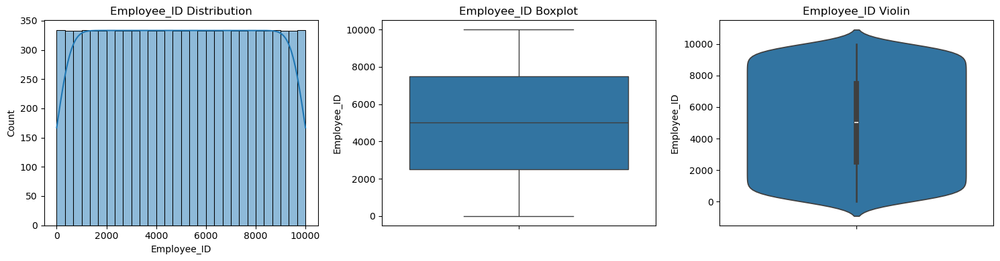

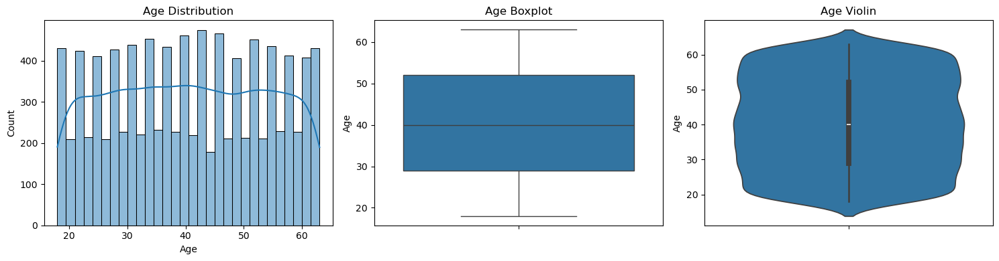

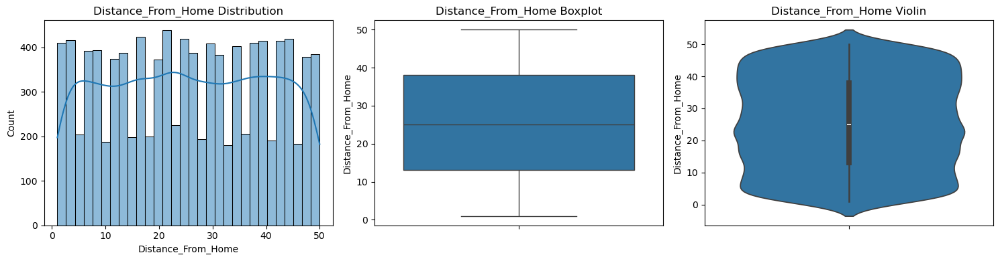

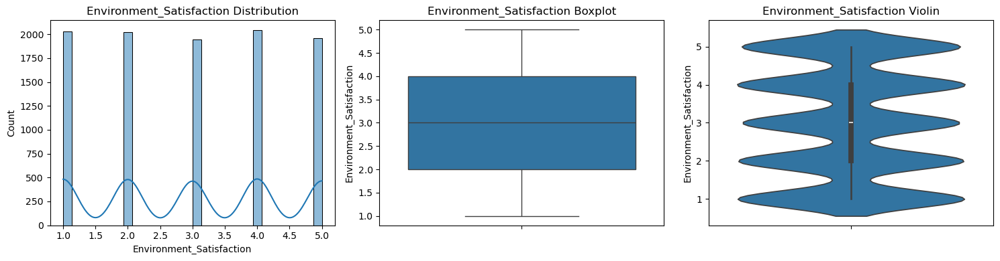

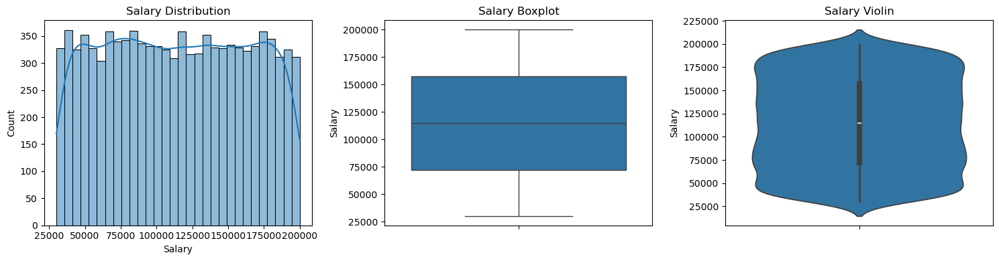

...

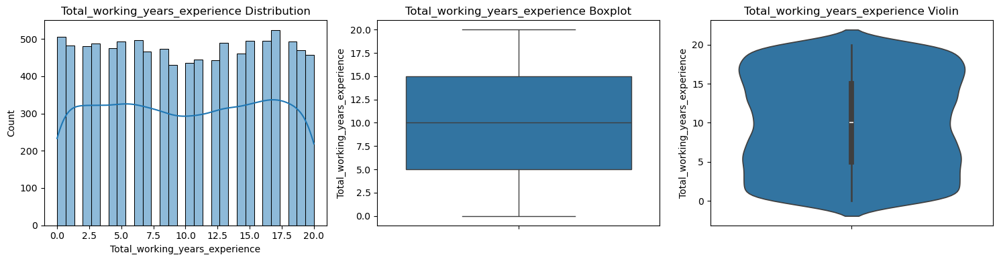

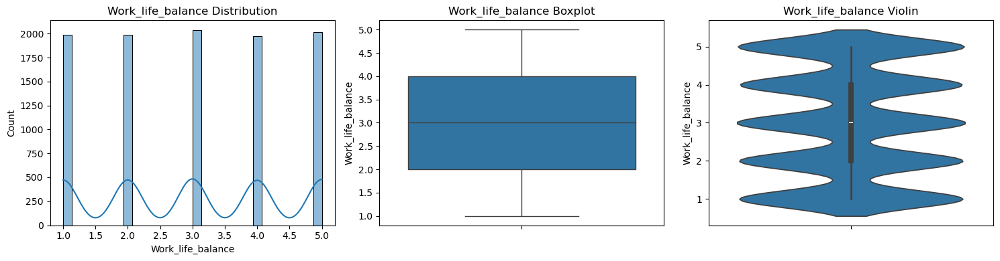

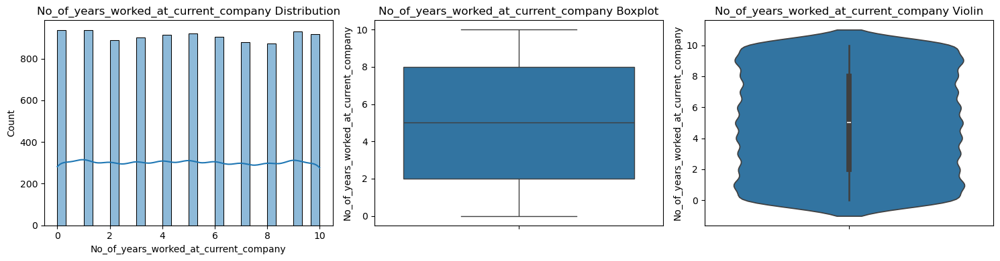

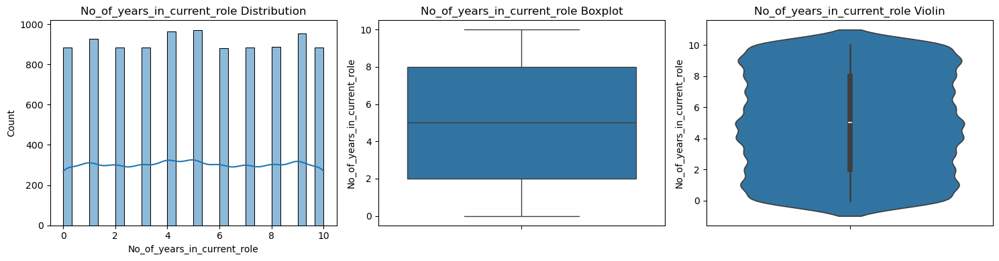

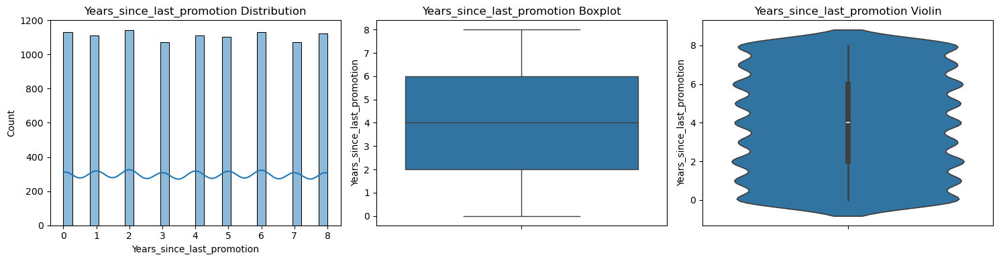

In [11]:
for col in num_cols:
    fig, ax = plt.subplots(1, 3, figsize=(15, 4))
    
    sns.histplot(df[col], ax=ax[0], bins=30, kde=True)
    ax[0].set_title("{} Distribution".format(col))

    sns.boxplot(df[col], ax=ax[1])
    ax[1].set_title("{} Boxplot".format(col))

    sns.violinplot(df[col], ax=ax[2])
    ax[2].set_title("{} Violin".format(col))

    plt.tight_layout()
    plt.show()

C:\Users\aksha\anaconda3\envs\ml_env\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


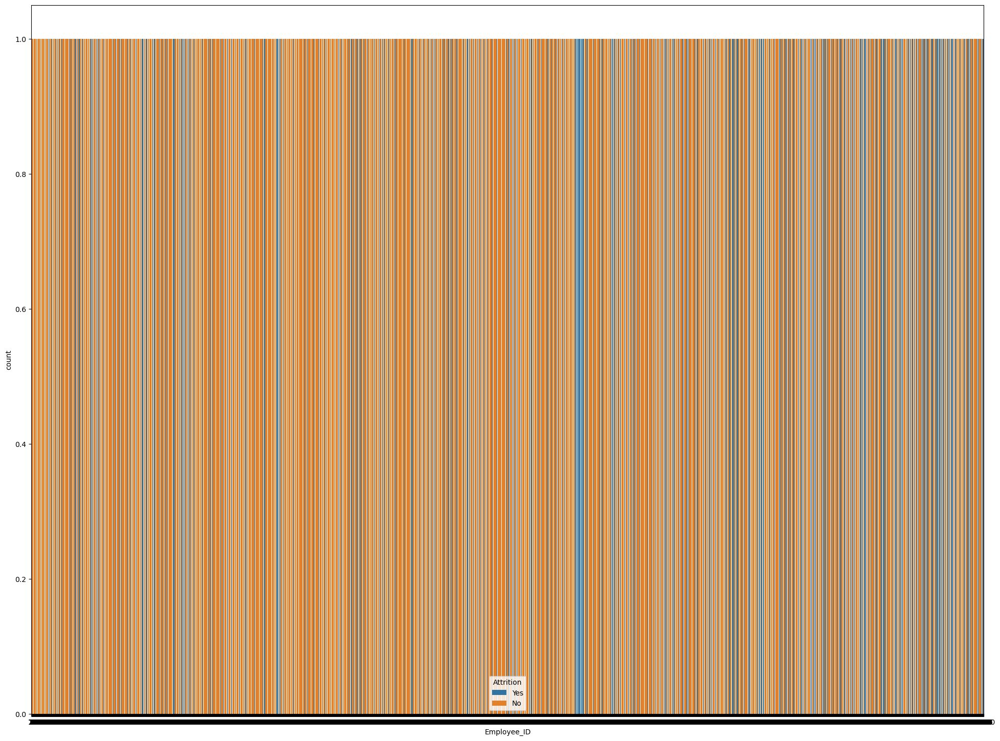

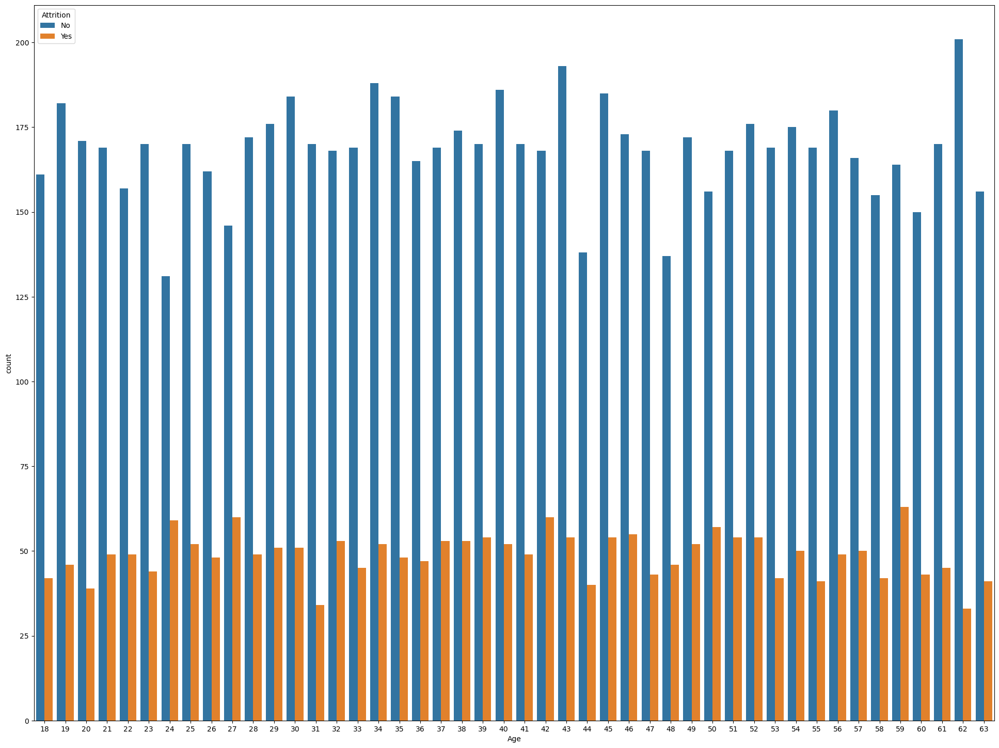

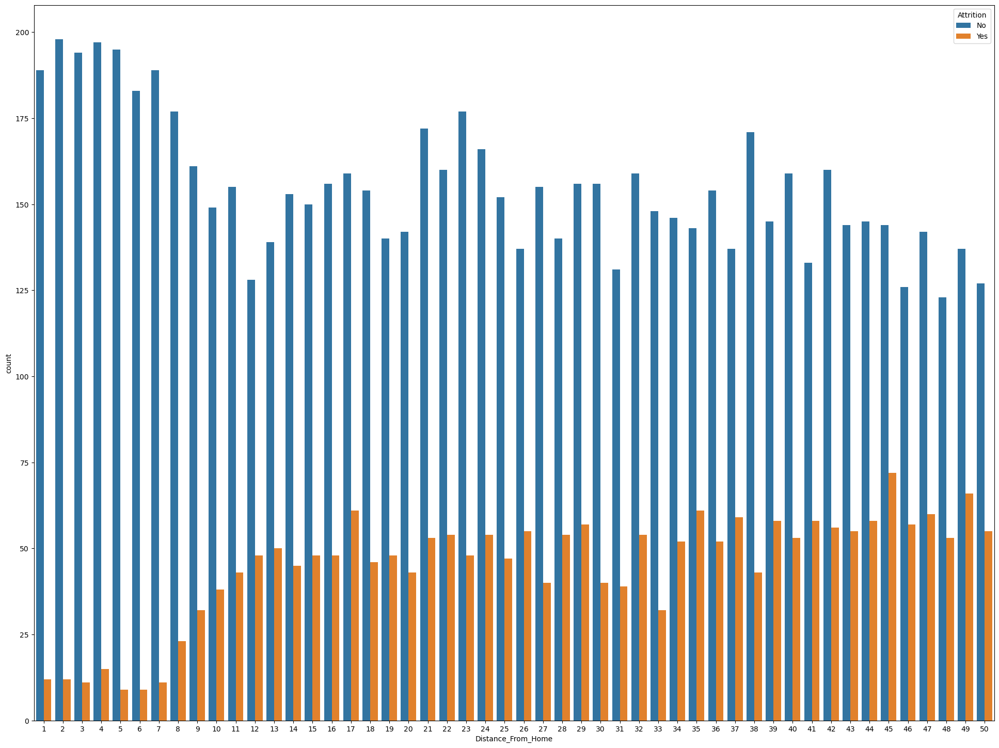

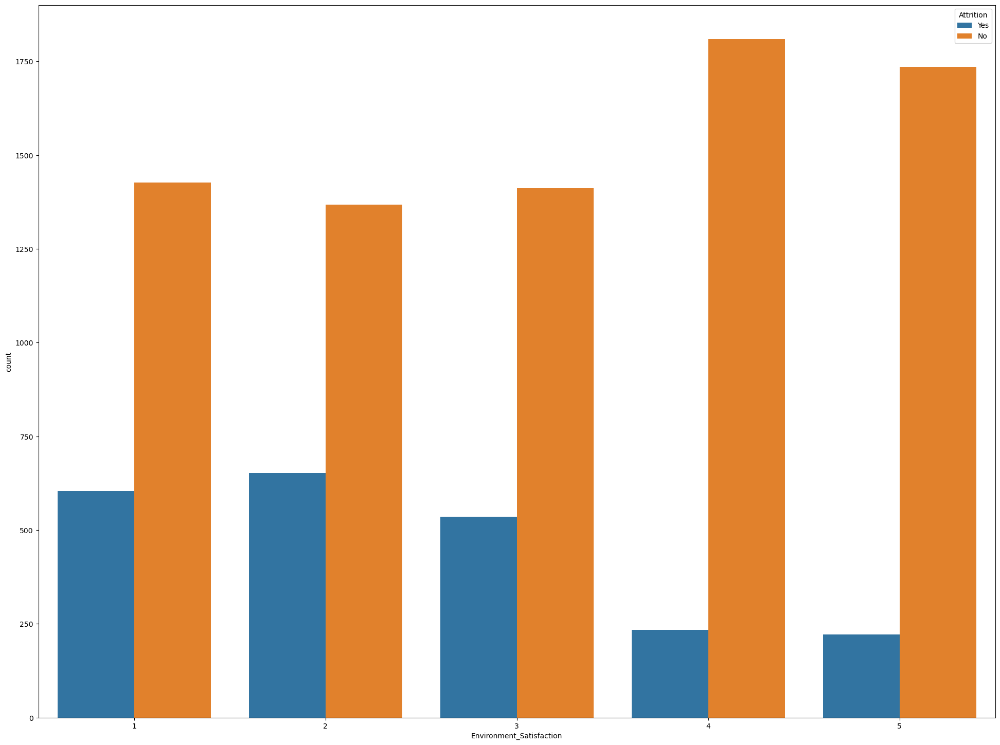

C:\Users\aksha\anaconda3\envs\ml_env\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


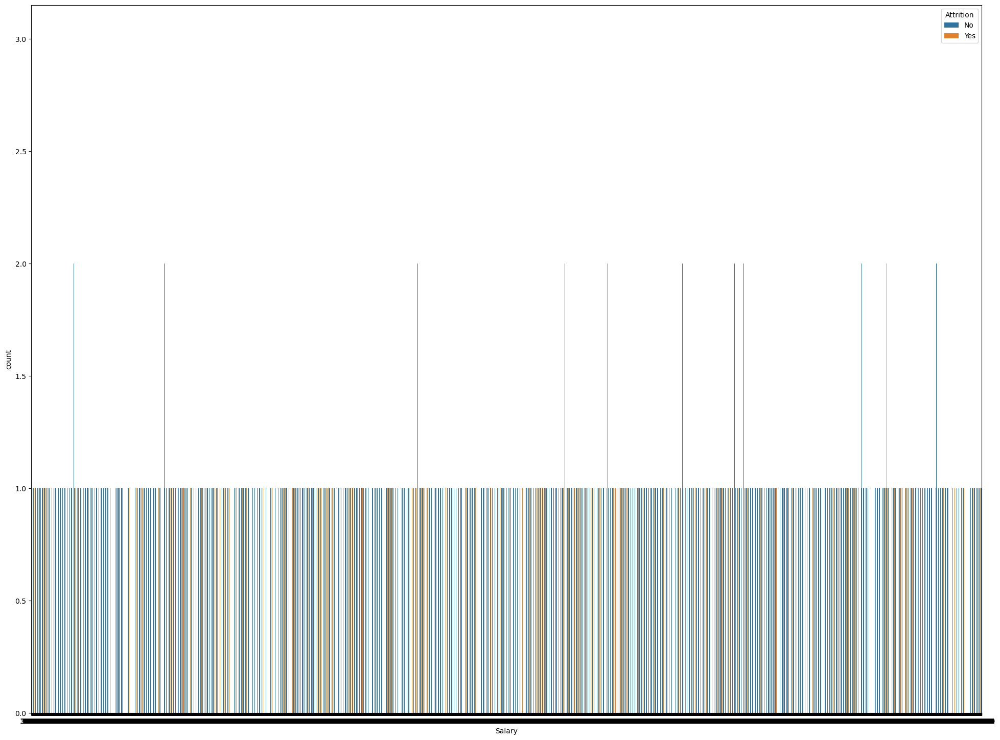

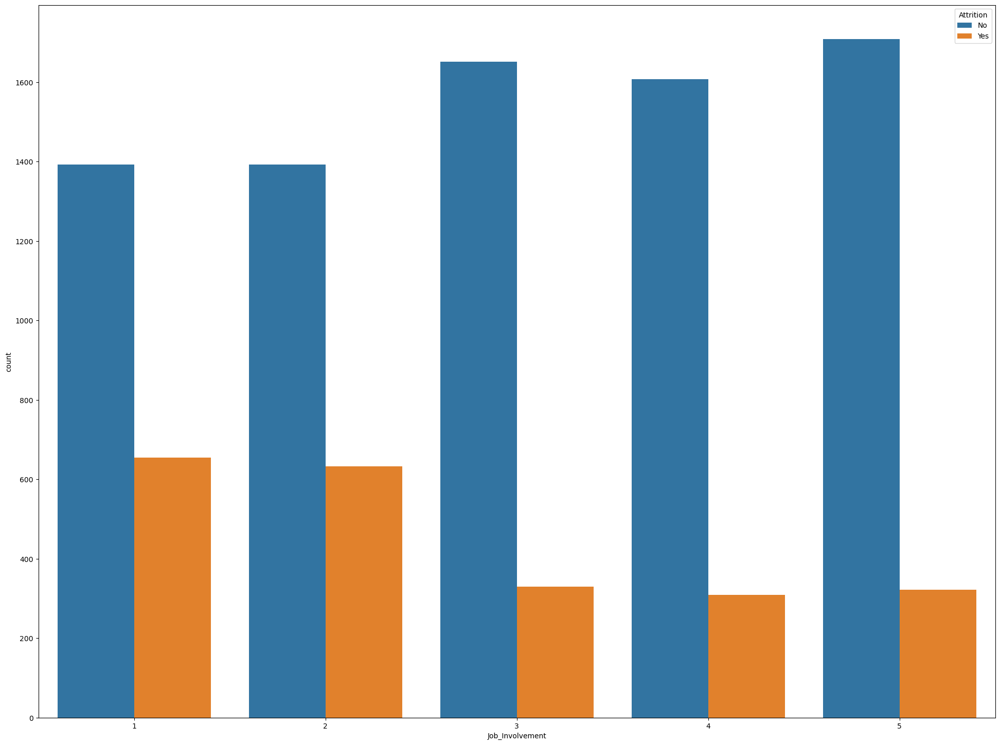

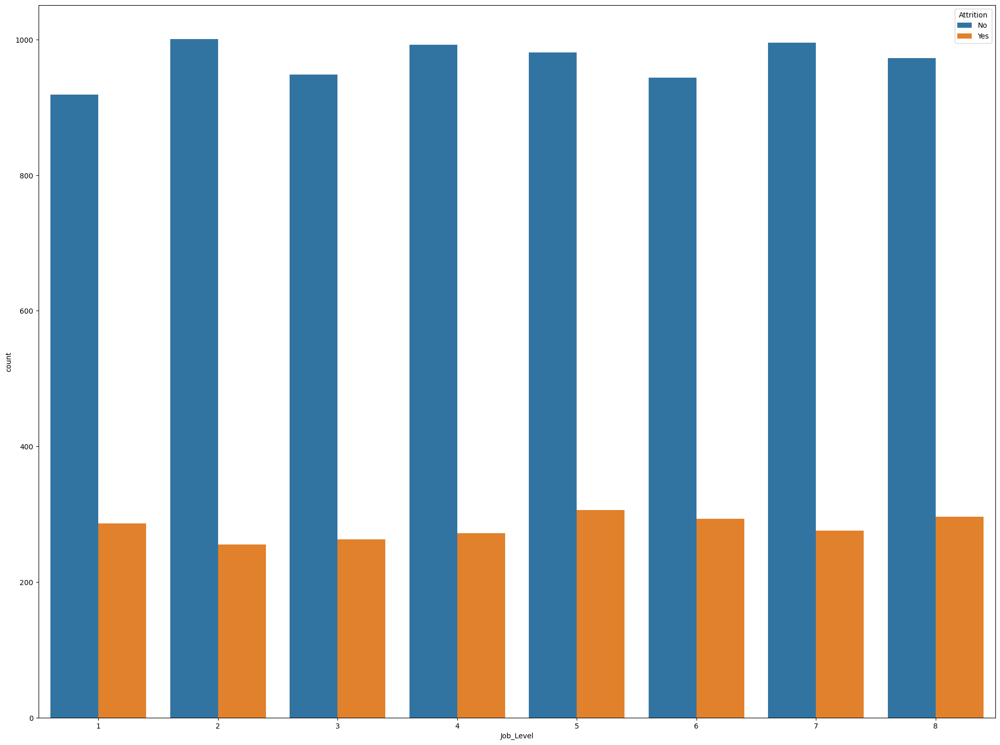

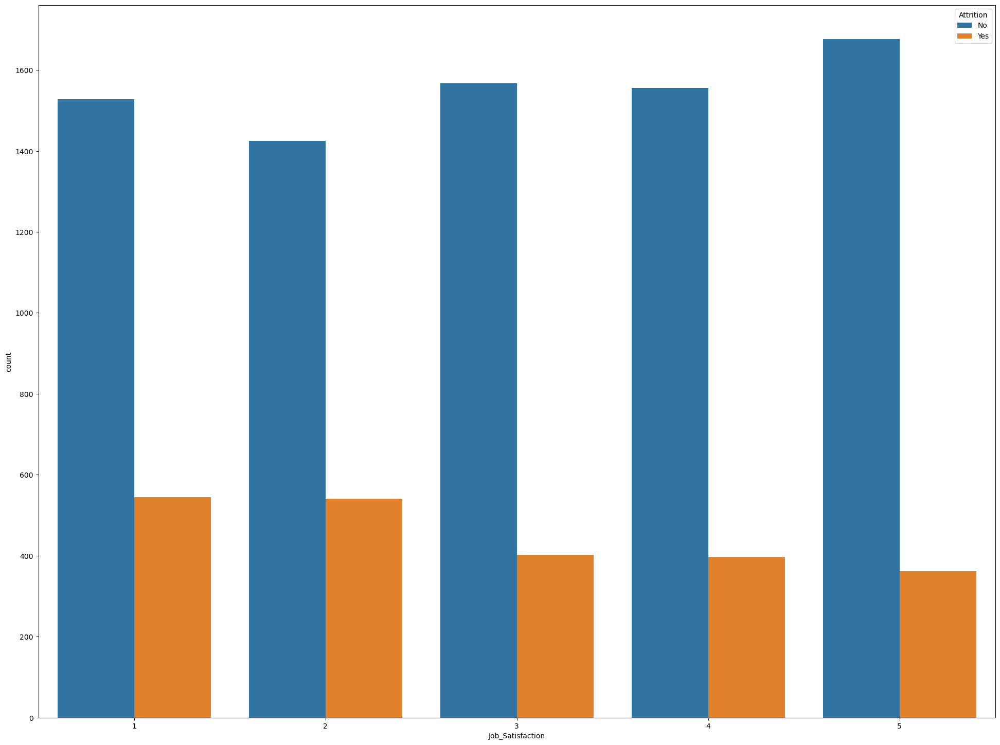

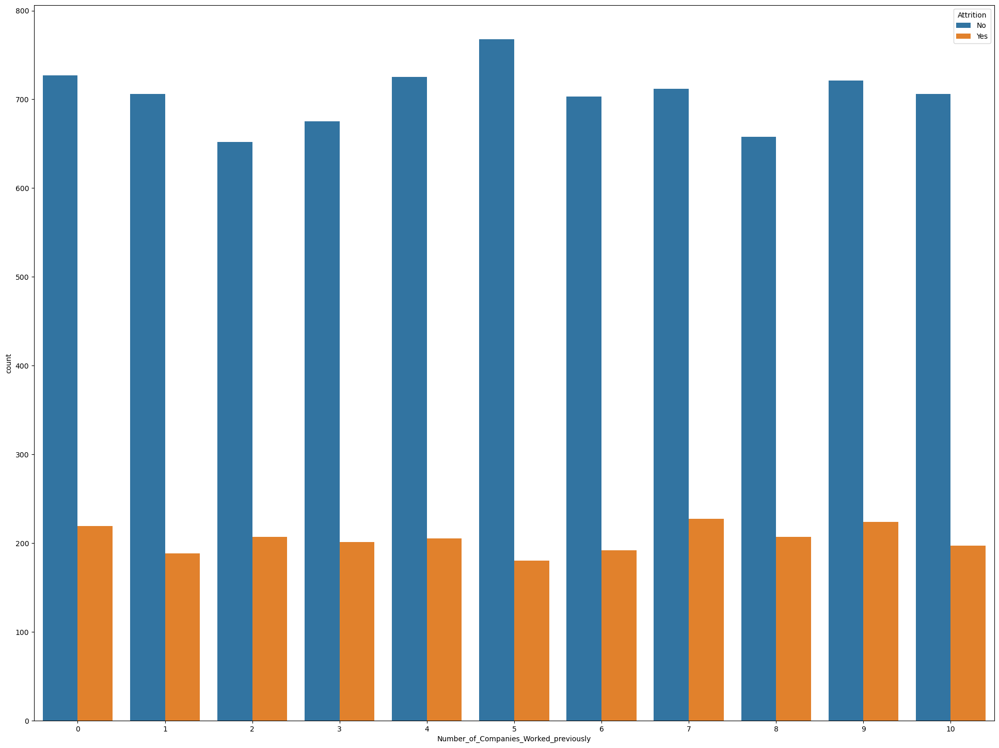

...

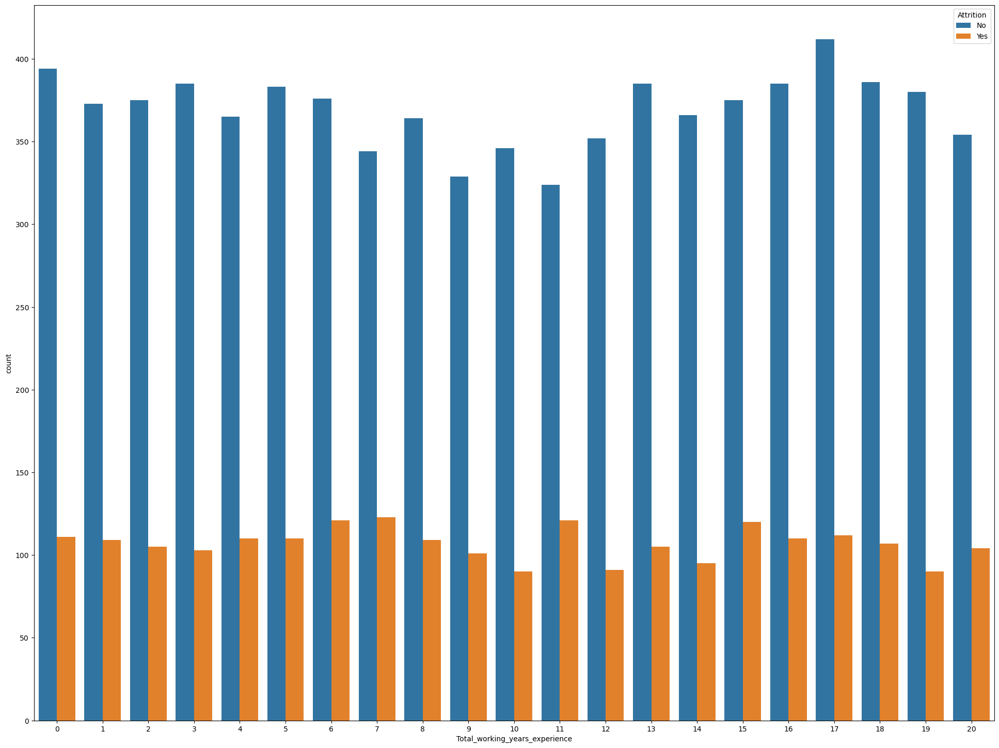

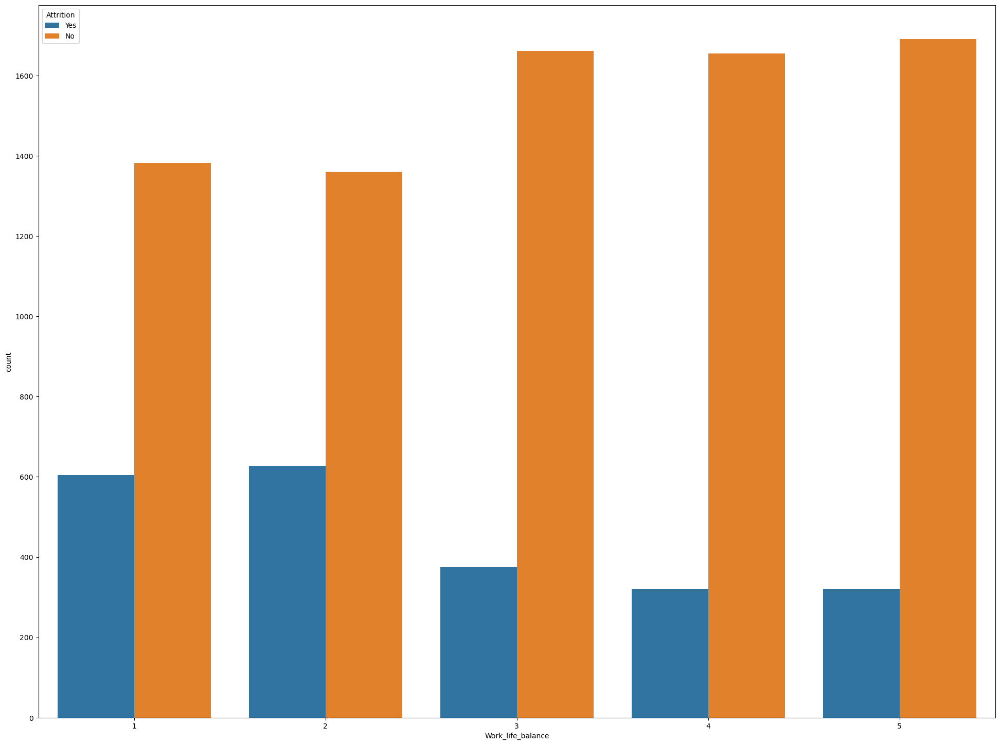

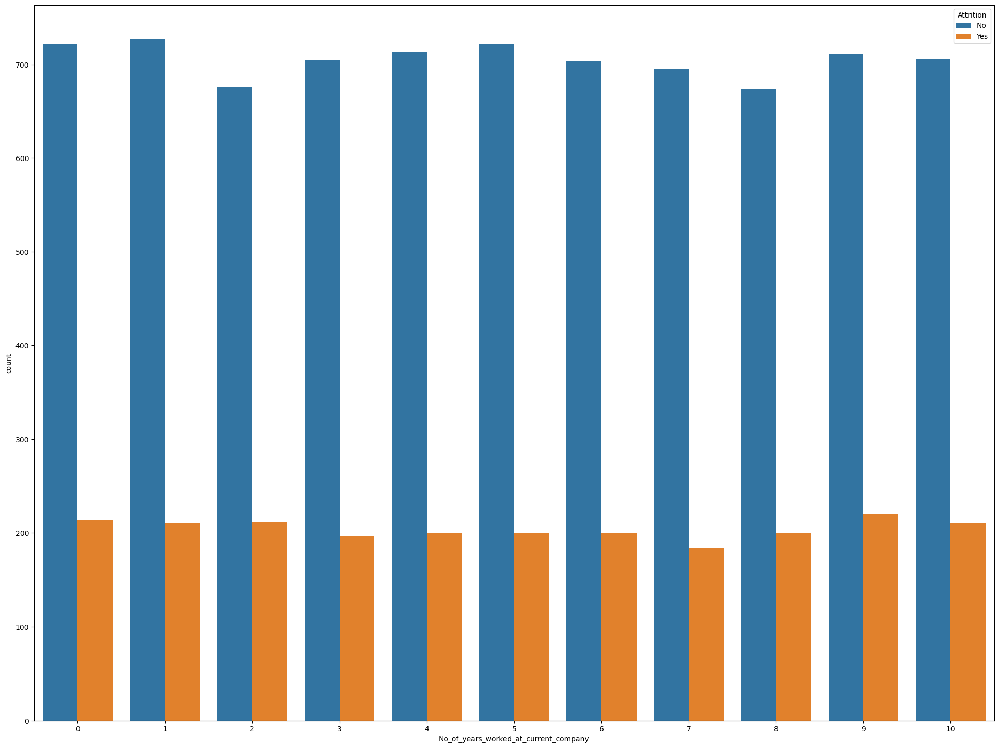

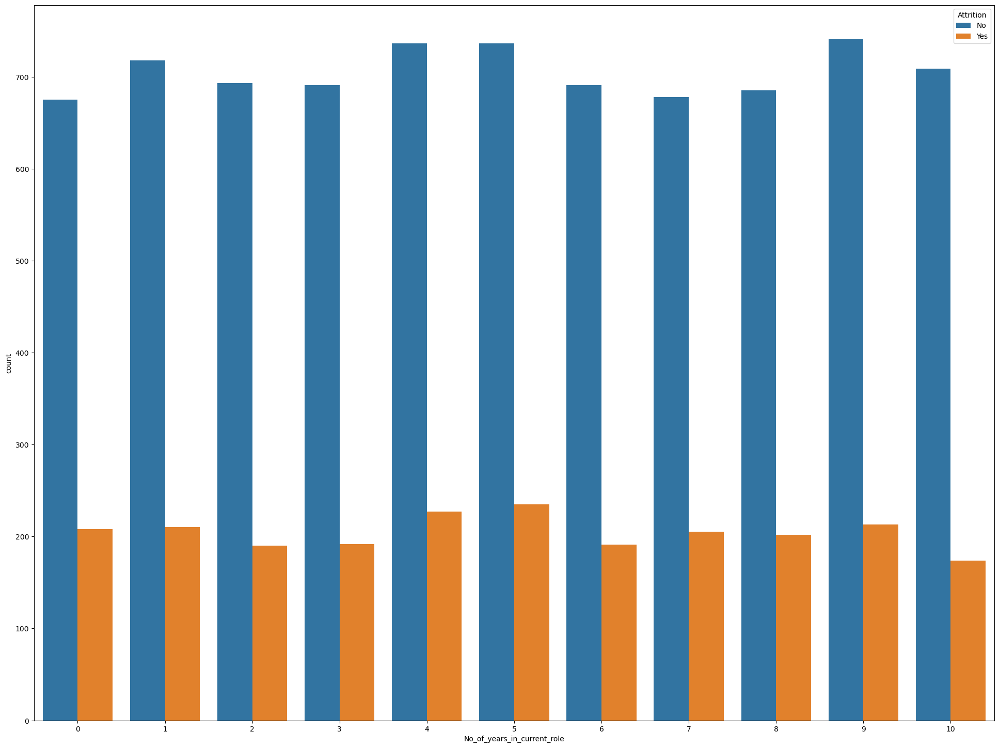

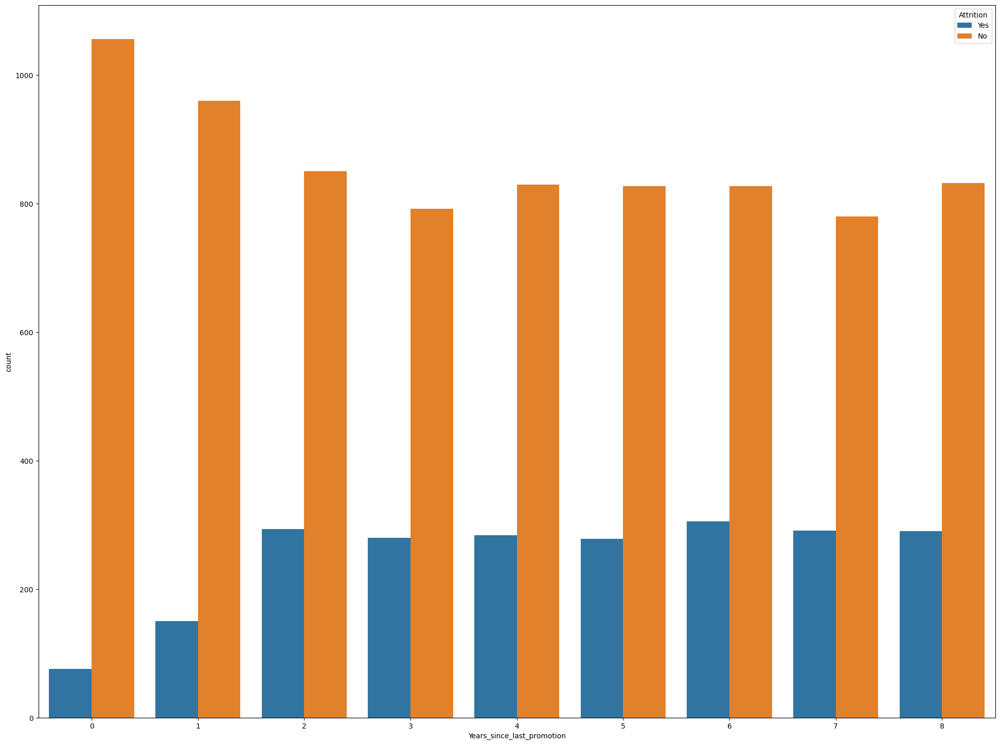

In [12]:
for col in num_cols:
    plt.figure(figsize=(24, 18))
    sns.countplot(data=df, x=col, hue='Attrition')
    plt.show()

C:\Users\aksha\AppData\Local\Temp\ipykernel_21012\3387099754.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))


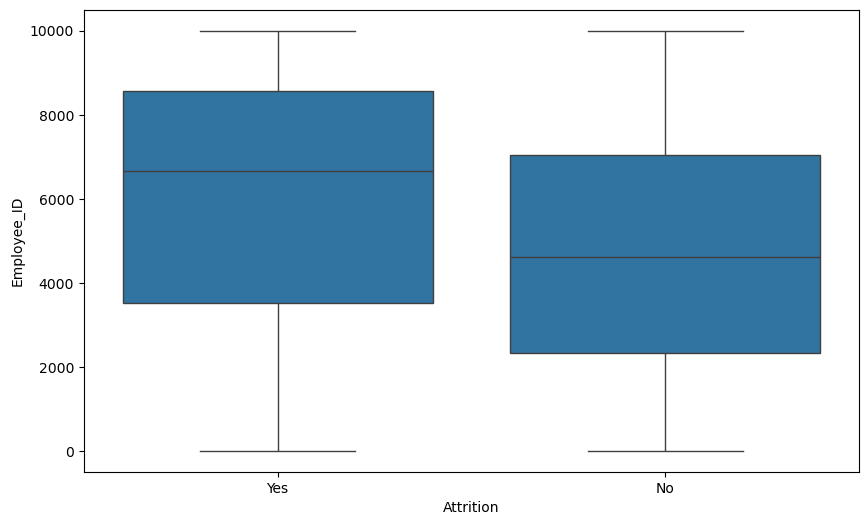

<Figure size 640x480 with 0 Axes>

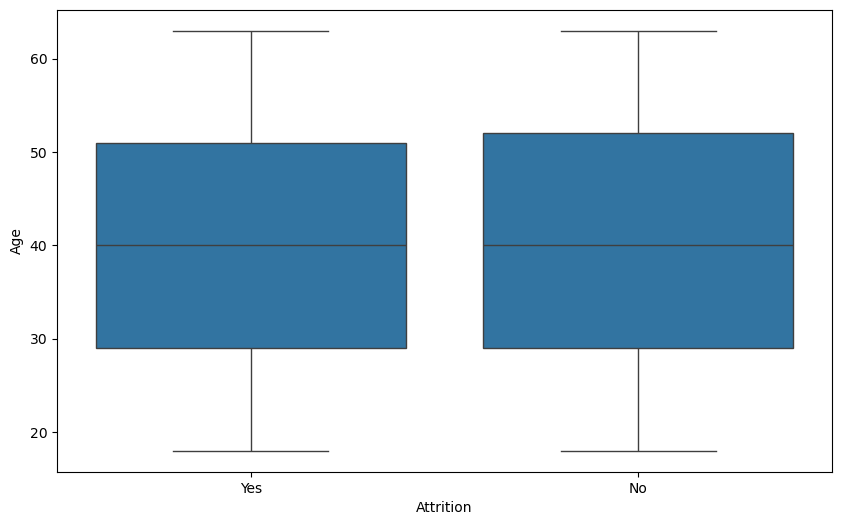

<Figure size 640x480 with 0 Axes>

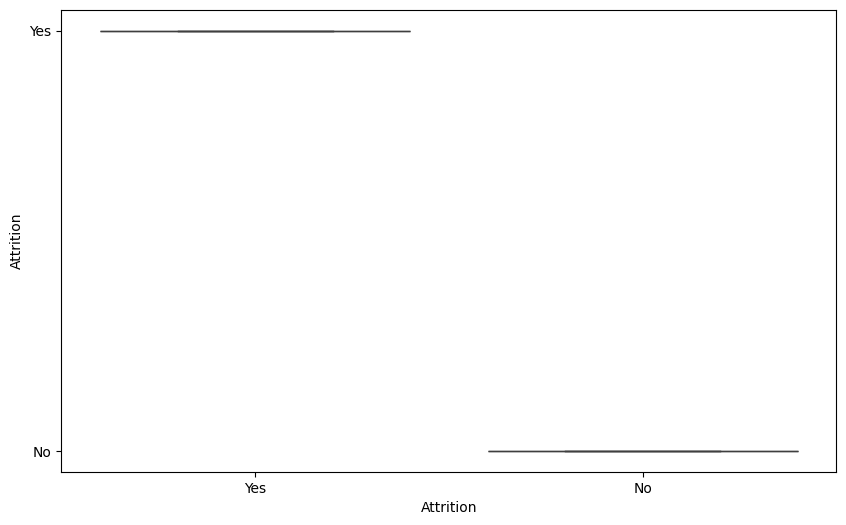

<Figure size 640x480 with 0 Axes>

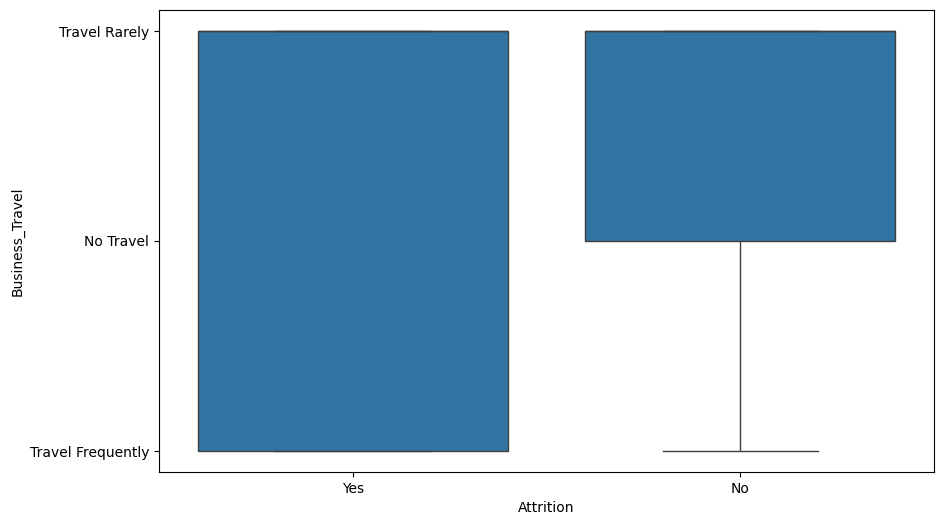

<Figure size 640x480 with 0 Axes>

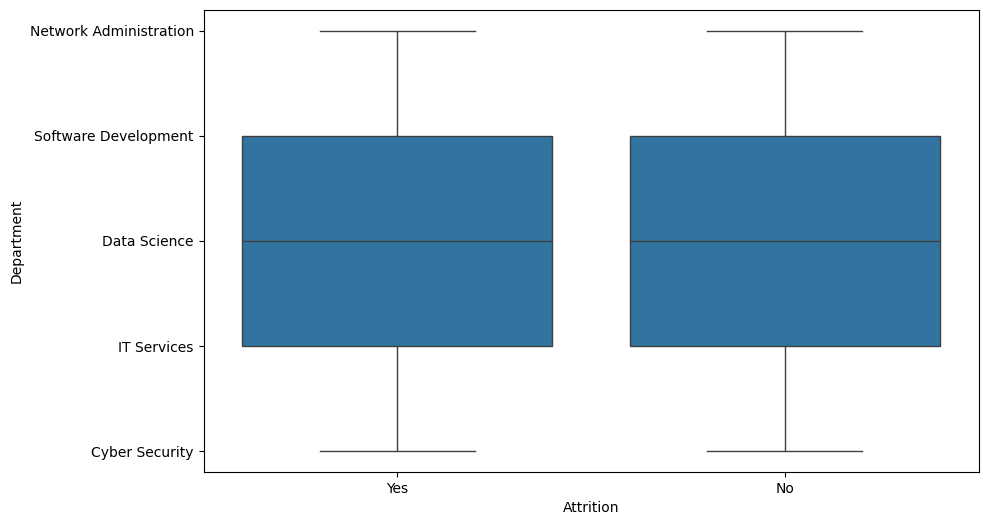

<Figure size 640x480 with 0 Axes>

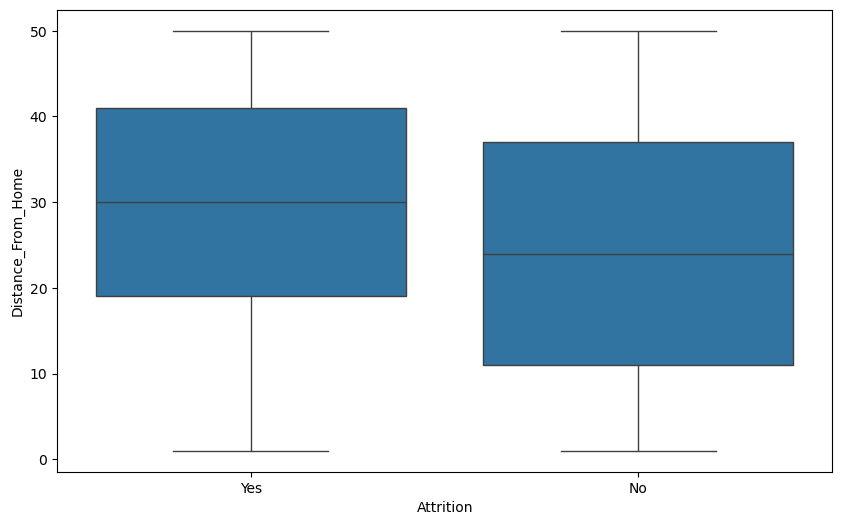

<Figure size 640x480 with 0 Axes>

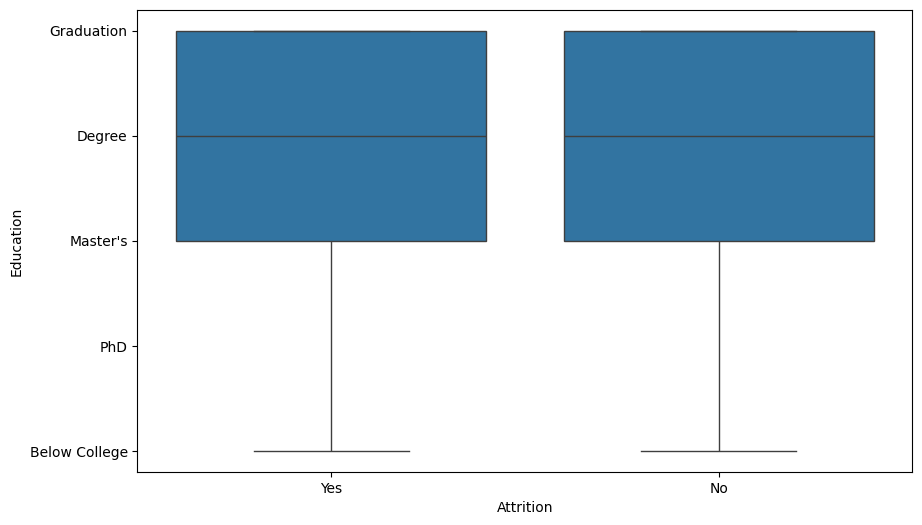

<Figure size 640x480 with 0 Axes>

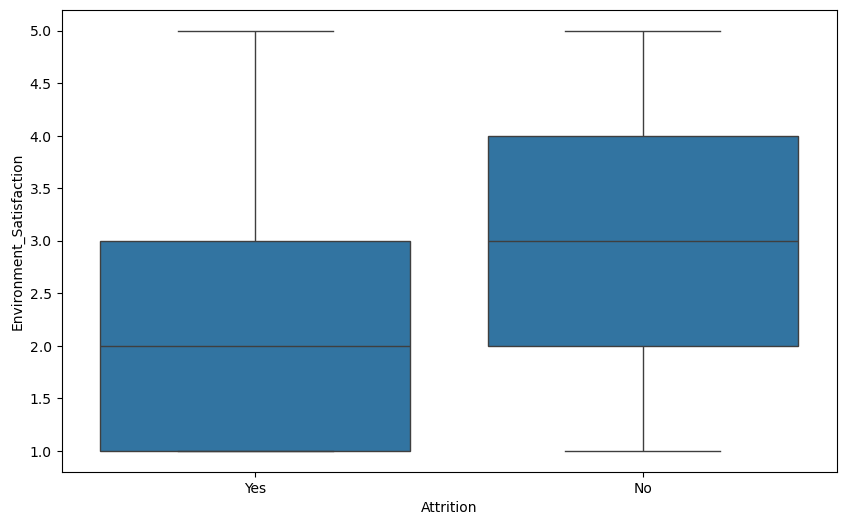

<Figure size 640x480 with 0 Axes>

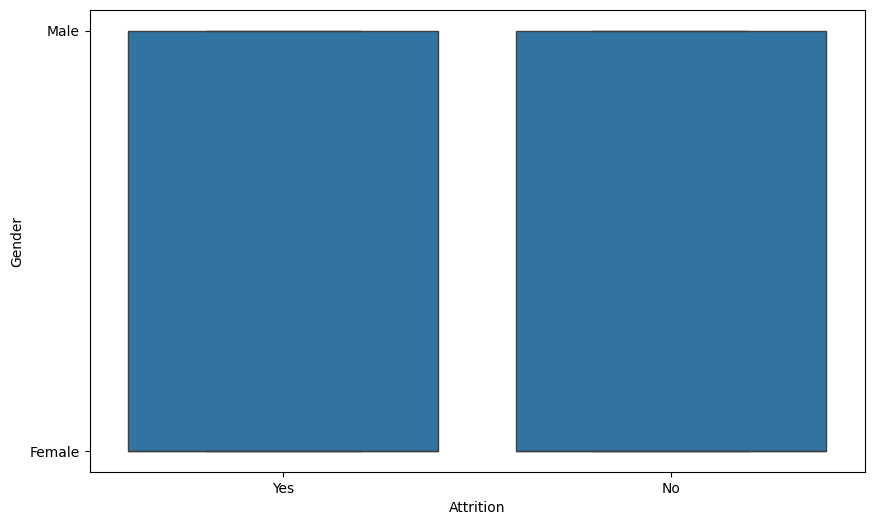

<Figure size 640x480 with 0 Axes>

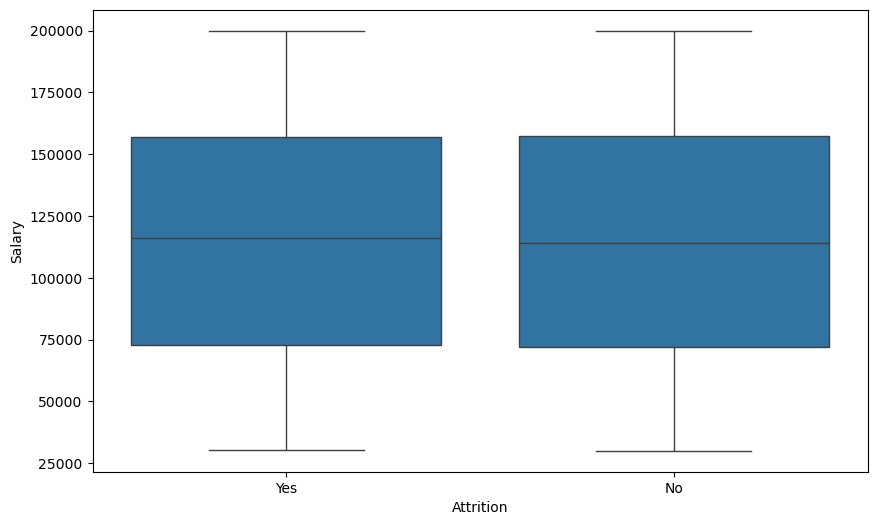

<Figure size 640x480 with 0 Axes>

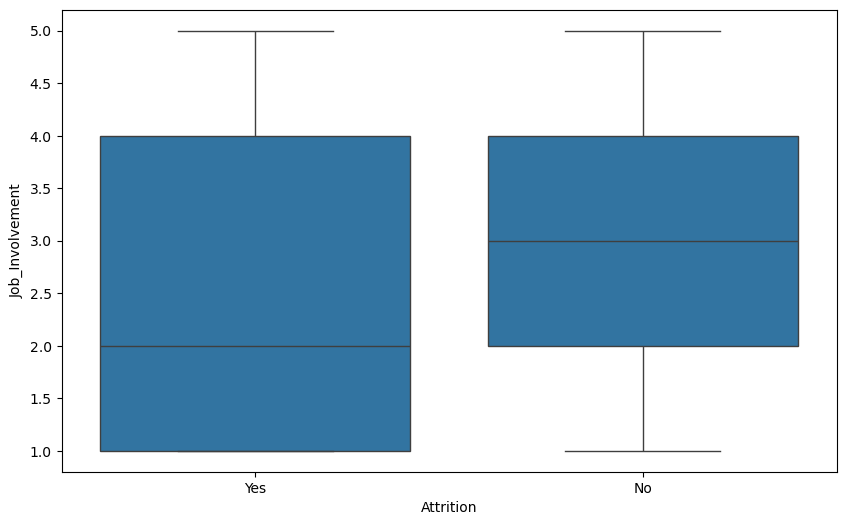

<Figure size 640x480 with 0 Axes>

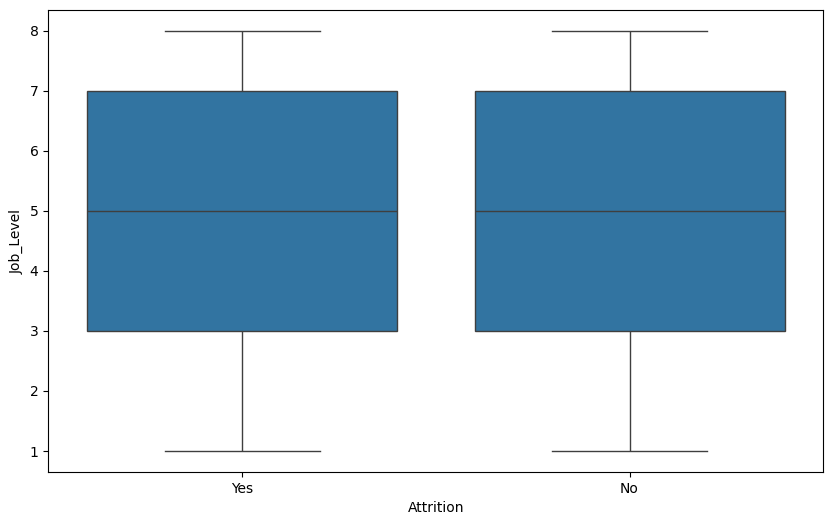

<Figure size 640x480 with 0 Axes>

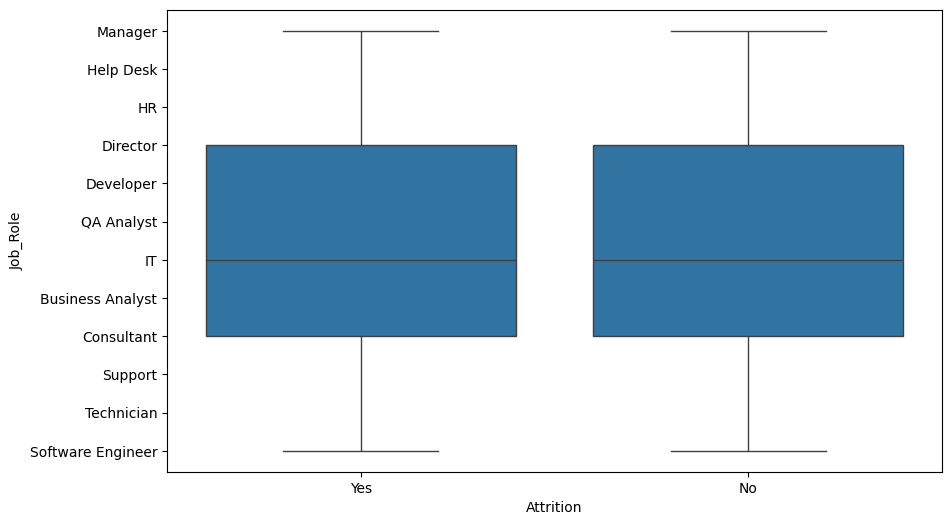

<Figure size 640x480 with 0 Axes>

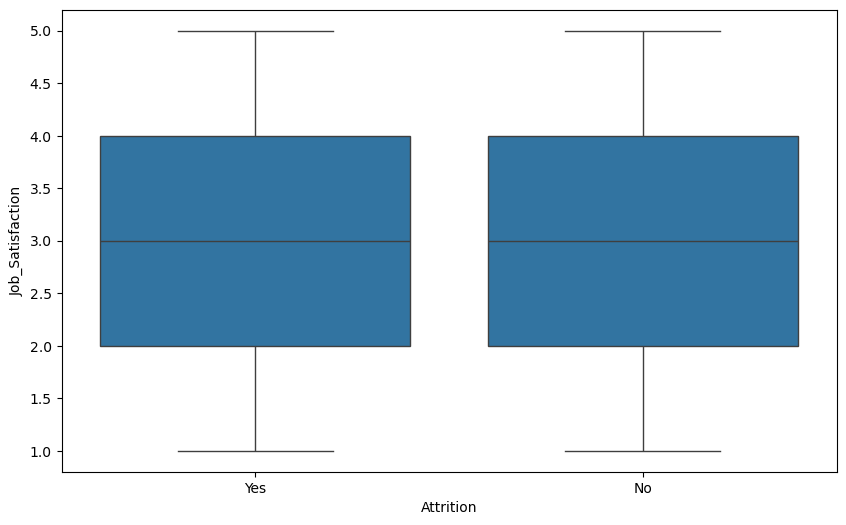

<Figure size 640x480 with 0 Axes>

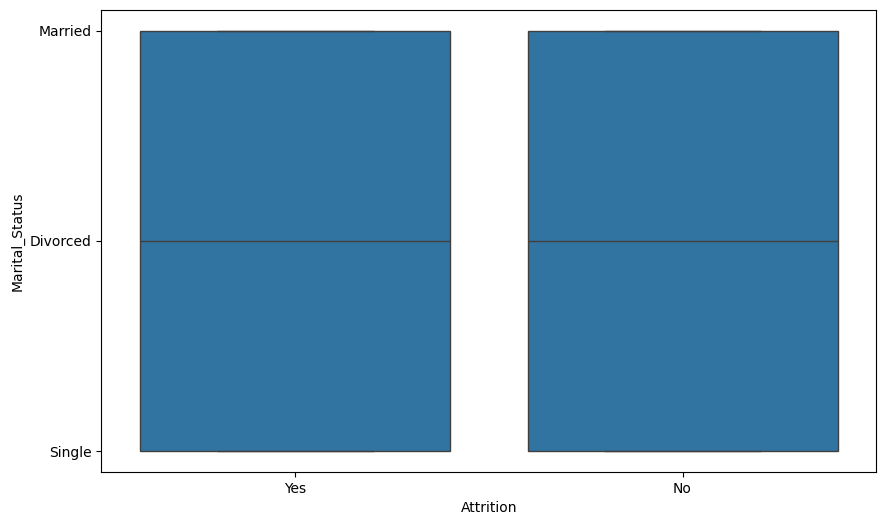

<Figure size 640x480 with 0 Axes>

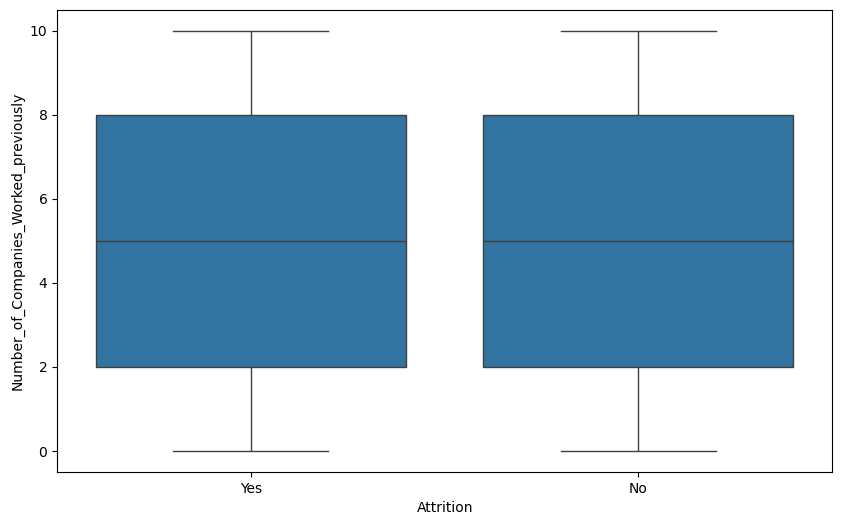

<Figure size 640x480 with 0 Axes>

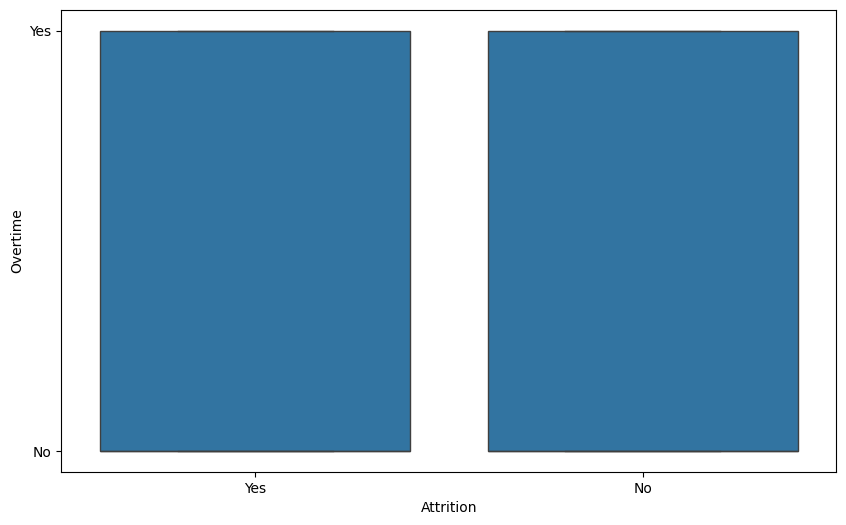

<Figure size 640x480 with 0 Axes>

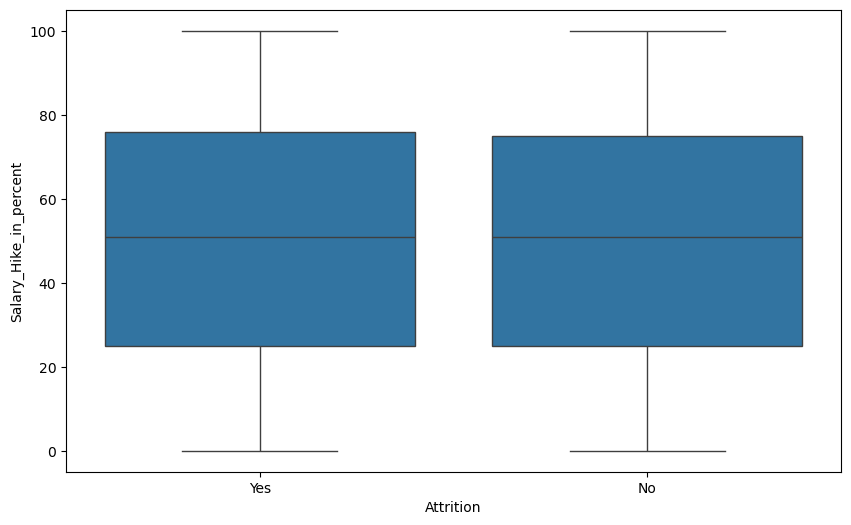

<Figure size 640x480 with 0 Axes>

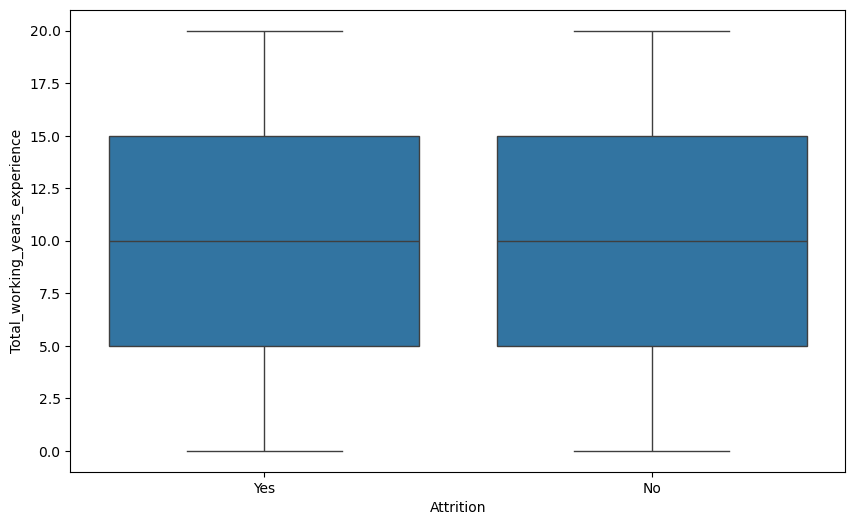

<Figure size 640x480 with 0 Axes>

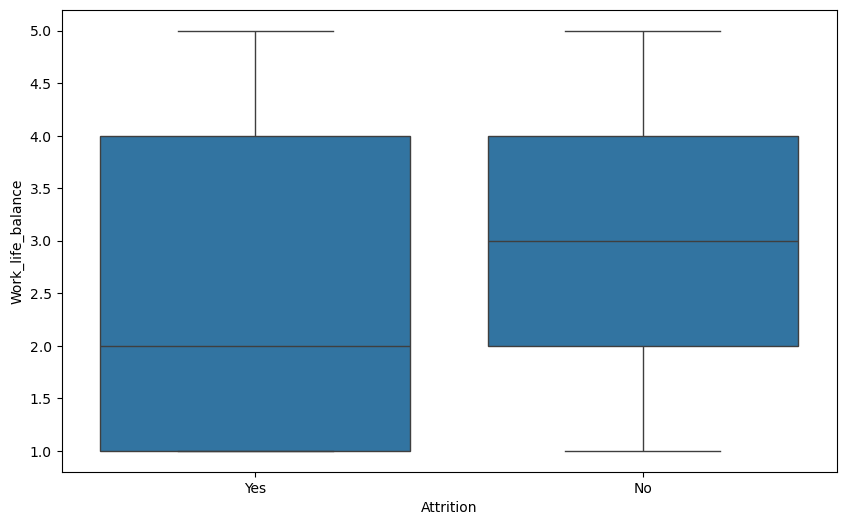

<Figure size 640x480 with 0 Axes>

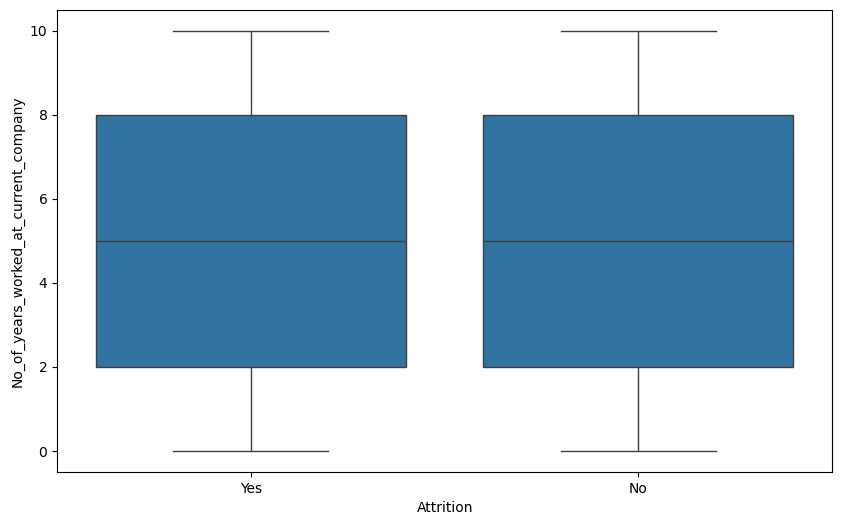

<Figure size 640x480 with 0 Axes>

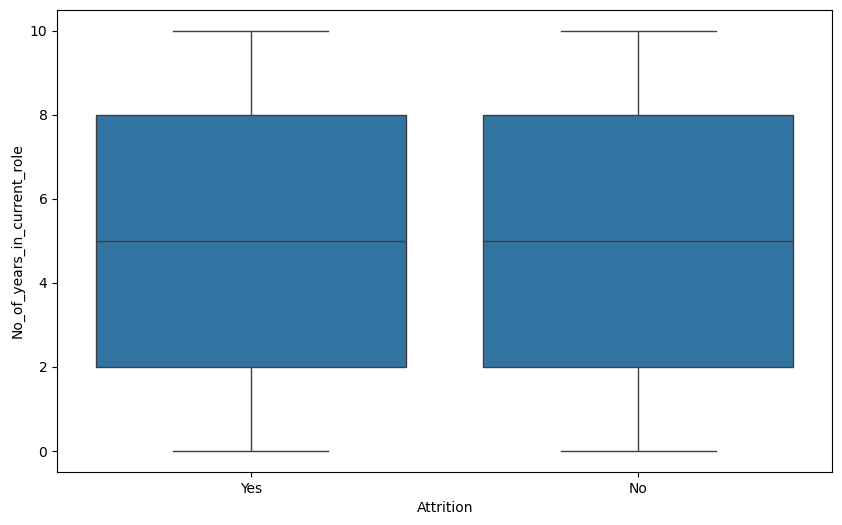

<Figure size 640x480 with 0 Axes>

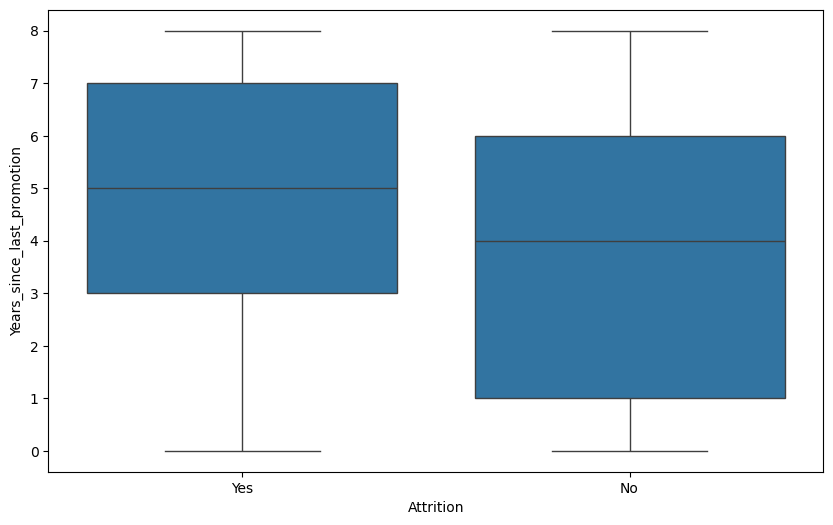

<Figure size 640x480 with 0 Axes>

In [13]:
for col in df.columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(df, x='Attrition', y=col)
    plt.figure()

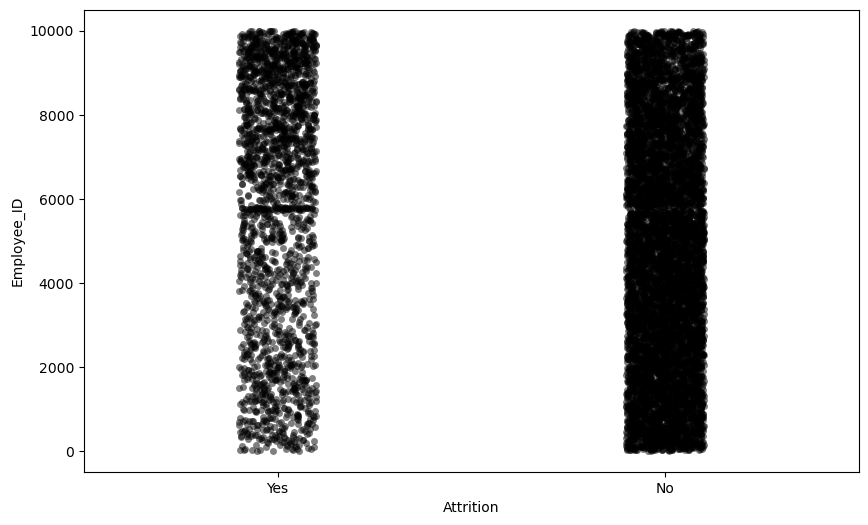

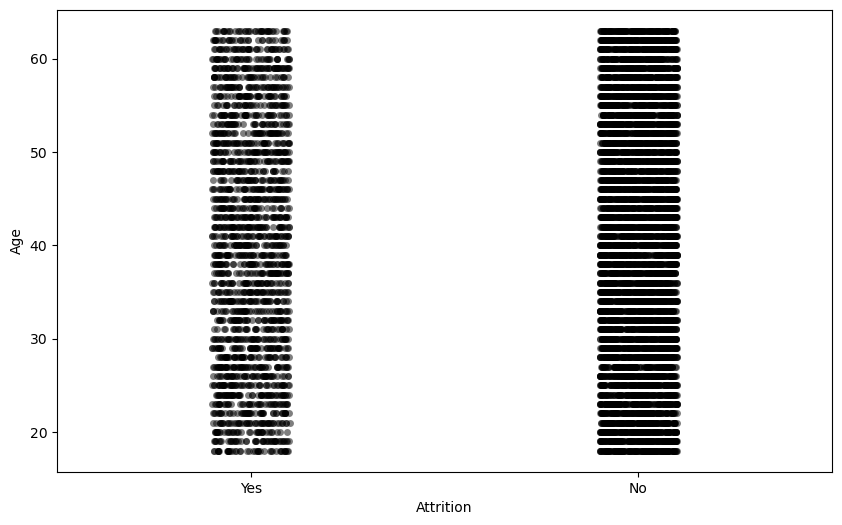

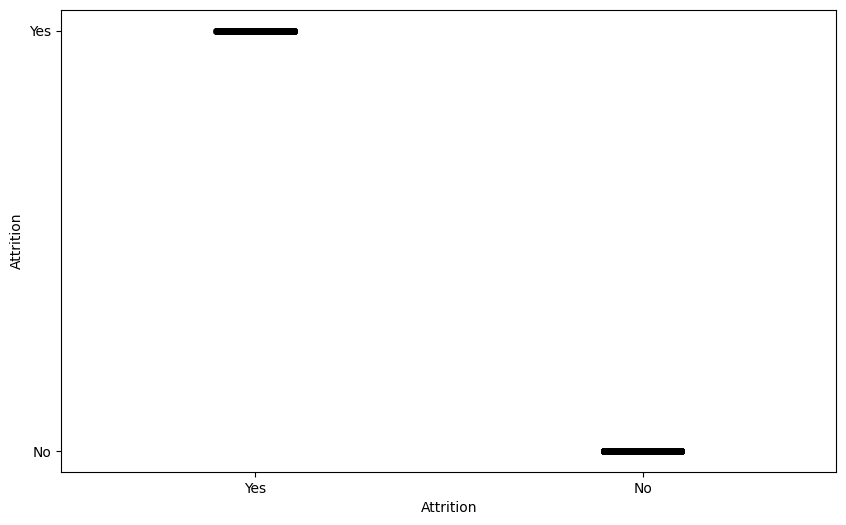

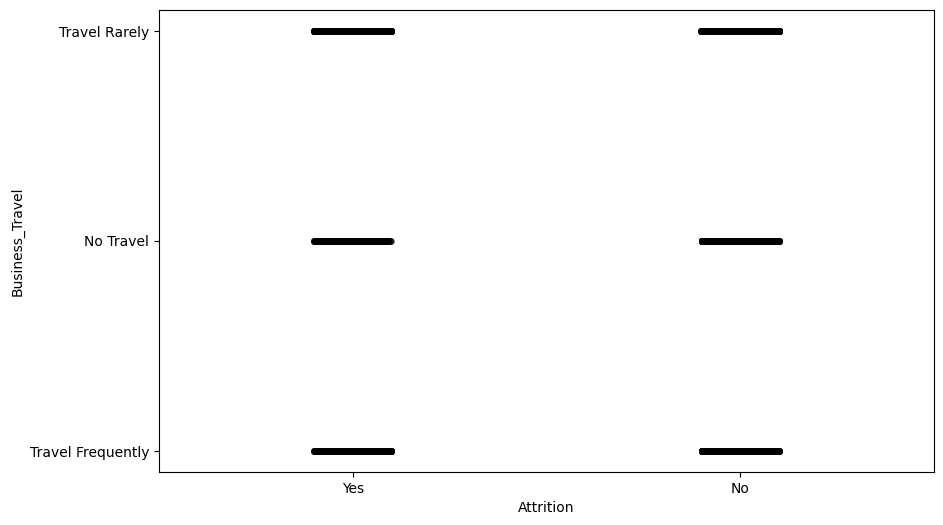

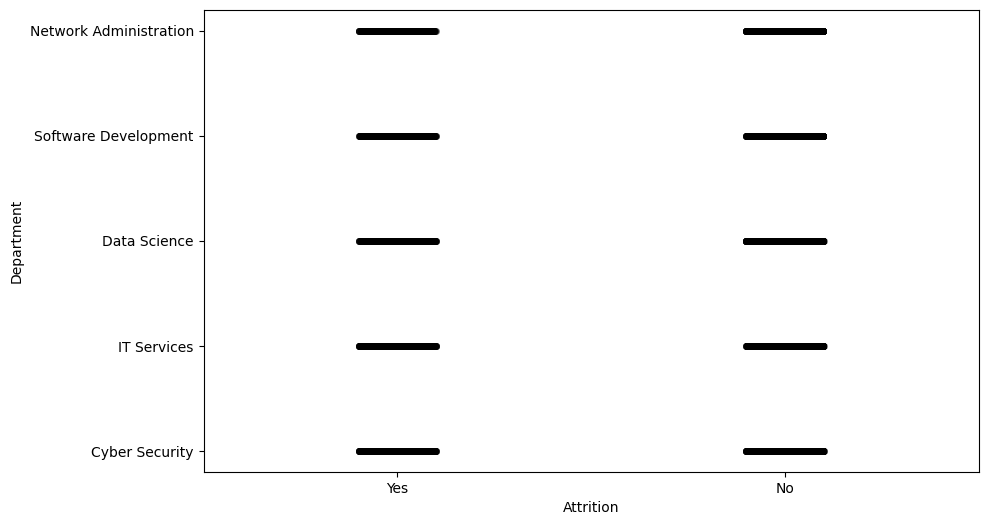

...

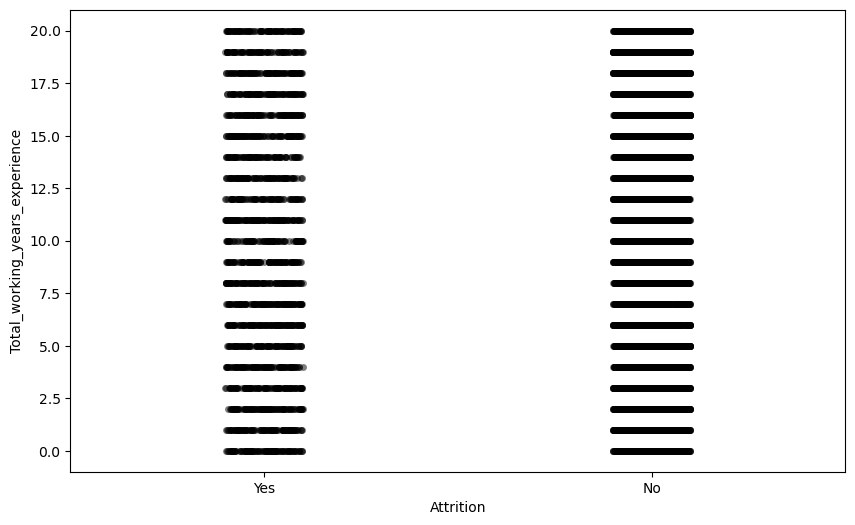

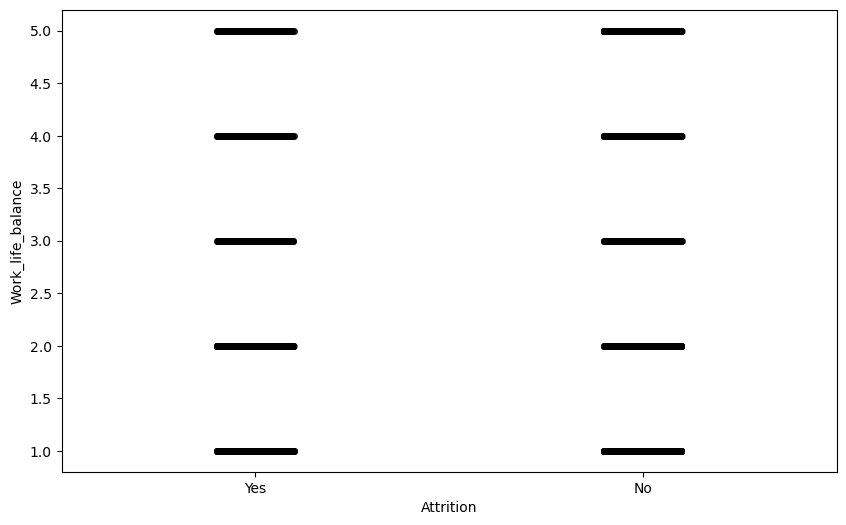

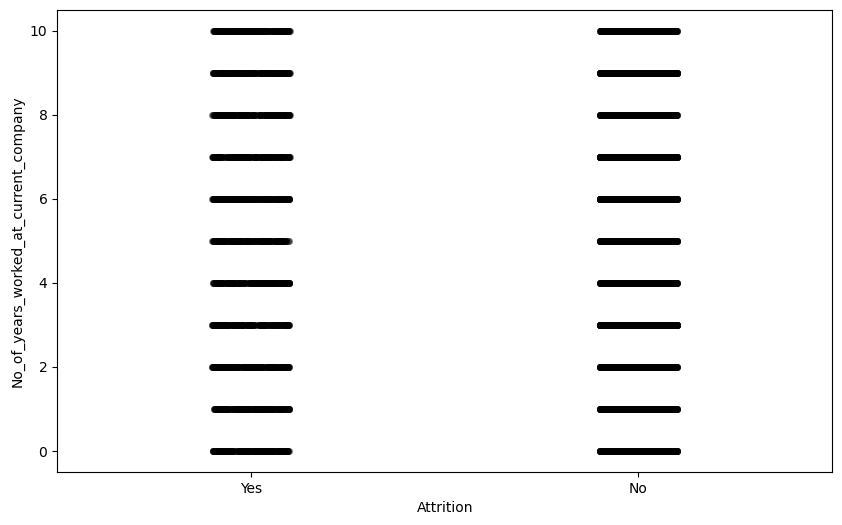

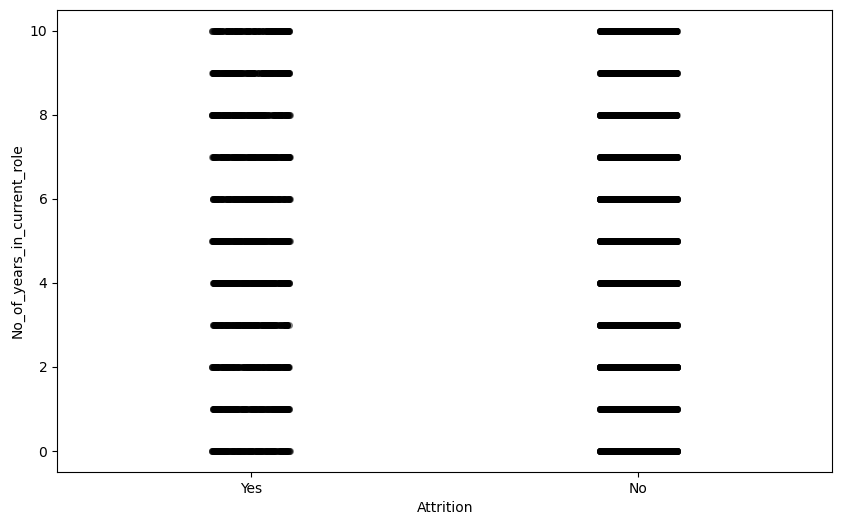

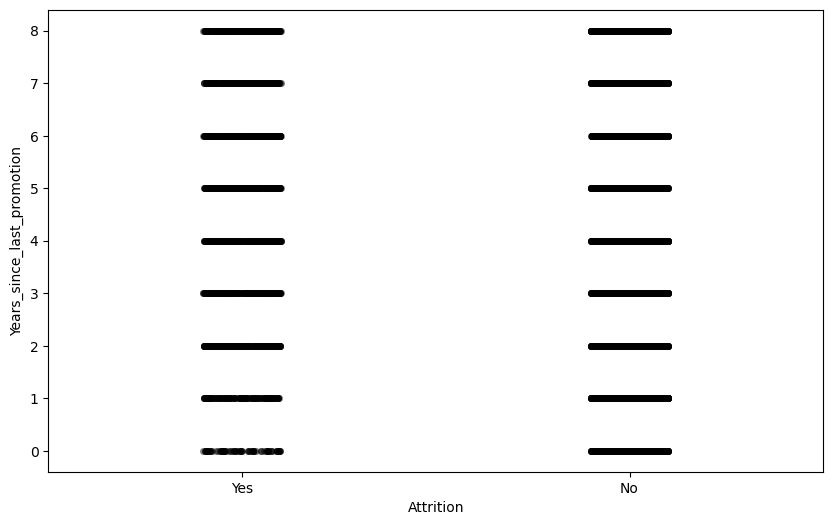

In [14]:
for col in df.columns:
    plt.figure(figsize=(10, 6))
    sns.stripplot(x='Attrition', y=col, data=df, color='black', alpha=0.5)
    plt.show()

In [15]:
mapped_attrition = {"Yes":1, "No":0}
df_c = df.copy()
df_c['Attrition'] = df_c['Attrition'].map(mapped_attrition)

In [16]:
df_c['Attrition'].value_counts()

Attrition
0    7753
1    2247
Name: count, dtype: int64

In [17]:
df_c[num_cols].corrwith(df_c['Attrition'])

Employee_ID                              0.181573
Age                                     -0.005826
Distance_From_Home                       0.150030
Environment_Satisfaction                -0.195512
Salary                                   0.003142
Job_Involvement                         -0.161004
Job_Level                                0.008323
Job_Satisfaction                        -0.082565
Number_of_Companies_Worked_previously    0.003858
Salary_Hike_in_percent                   0.008079
Total_working_years_experience          -0.009346
Work_life_balance                       -0.149927
No_of_years_worked_at_current_company    0.000560
No_of_years_in_current_role             -0.010645
Years_since_last_promotion               0.123488
dtype: float64

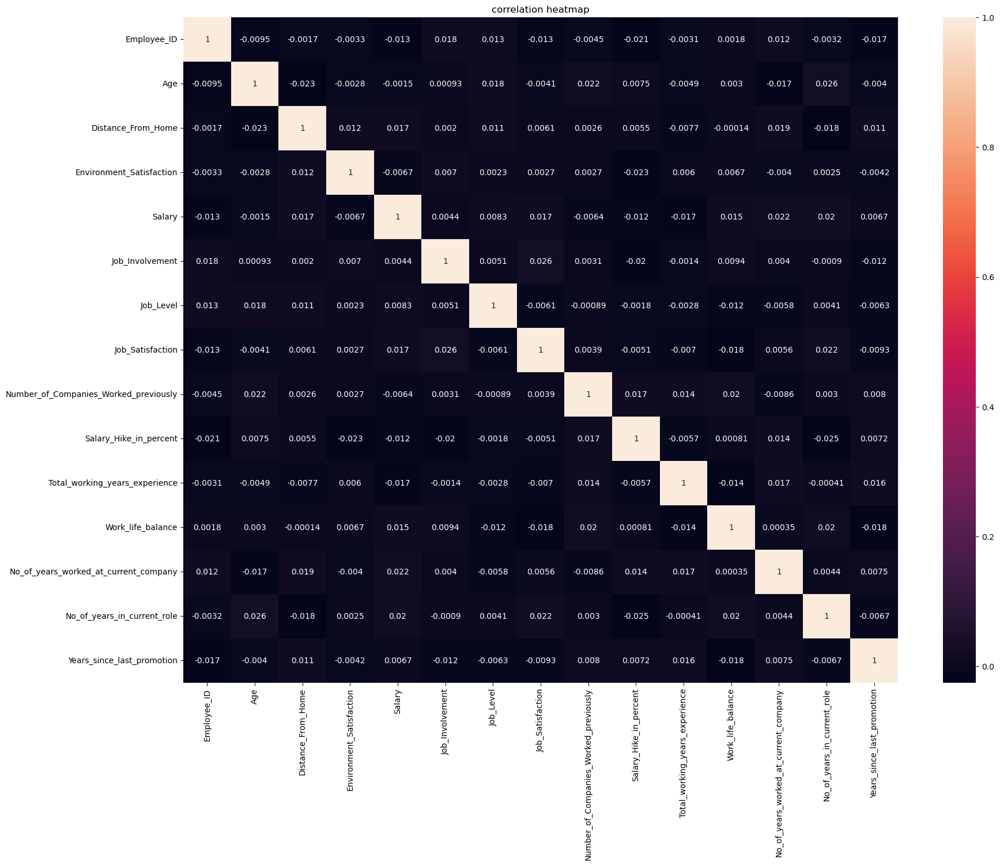

In [18]:
plt.figure(figsize=(20, 15))
sns.heatmap(df_c[num_cols].corr(), annot=True)
plt.title('correlation heatmap')
plt.show()

In [19]:
len(num_cols), len(cat_cols)

(15, 8)

In [20]:
num_cols.remove('Employee_ID')

In [21]:
num_cols

['Age',
 'Distance_From_Home',
 'Environment_Satisfaction',
 'Salary',
 'Job_Involvement',
 'Job_Level',
 'Job_Satisfaction',
 'Number_of_Companies_Worked_previously',
 'Salary_Hike_in_percent',
 'Total_working_years_experience',
 'Work_life_balance',
 'No_of_years_worked_at_current_company',
 'No_of_years_in_current_role',
 'Years_since_last_promotion']

In [22]:
df_c.head()

,Employee_ID,Age,Attrition,Business_Travel,Department,Distance_From_Home,Education,Environment_Satisfaction,Gender,Salary,Job_Involvement,Job_Level,Job_Role,Job_Satisfaction,Marital_Status,Number_of_Companies_Worked_previously,Overtime,Salary_Hike_in_percent,Total_working_years_experience,Work_life_balance,No_of_years_worked_at_current_company,No_of_years_in_current_role,Years_since_last_promotion
0,1,56,1,Travel Rarely,Network Administration,24,Graduation,5,Male,186630,2,6,Manager,4,Married,7,Yes,85,9,1,7,2,4
1,2,46,1,Travel Rarely,Software Development,45,Degree,5,Male,78553,4,5,Help Desk,2,Divorced,3,No,22,18,4,1,2,0
2,3,32,0,No Travel,Data Science,30,Master's,3,Female,175003,1,4,HR,2,Single,2,Yes,100,0,4,5,5,8
3,4,60,1,Travel Frequently,Data Science,42,Graduation,2,Female,100795,2,8,Help Desk,3,Married,5,No,72,17,2,1,7,3
4,5,25,0,No Travel,Network Administration,26,Graduation,4,Female,75256,1,2,Director,4,Single,9,No,21,12,5,7,2,4


In [23]:
df_c.describe()

,Employee_ID,Age,Attrition,Distance_From_Home,Environment_Satisfaction,Salary,Job_Involvement,Job_Level,Job_Satisfaction,Number_of_Companies_Worked_previously,Salary_Hike_in_percent,Total_working_years_experience,Work_life_balance,No_of_years_worked_at_current_company,No_of_years_in_current_role,Years_since_last_promotion
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,40.494900,0.224700,25.445100,2.987800,114492.519000,2.986300,4.53120,2.991900,5.009800,50.148600,9.978800,3.003600,4.978000,5.003500,3.985400
std,2886.89568,13.162298,0.417405,14.390431,1.414939,49009.843725,1.422995,2.28564,1.427178,3.166371,29.154528,6.110686,1.412865,3.177849,3.148187,2.587944
min,1.00000,18.000000,0.000000,1.000000,1.000000,30078.000000,1.000000,1.00000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,2500.75000,29.000000,0.000000,13.000000,2.000000,72124.000000,2.000000,3.00000,2.000000,2.000000,25.000000,5.000000,2.000000,2.000000,2.000000,2.000000
50%,5000.50000,40.000000,0.000000,25.000000,3.000000,114499.000000,3.000000,5.00000,3.000000,5.000000,51.000000,10.000000,3.000000,5.000000,5.000000,4.000000
75%,7500.25000,52.000000,0.000000,38.000000,4.000000,157213.000000,4.000000,7.00000,4.000000,8.000000,75.000000,15.000000,4.000000,8.000000,8.000000,6.000000
max,10000.00000,63.000000,1.000000,50.000000,5.000000,199989.000000,5.000000,8.00000,5.000000,10.000000,100.000000,20.000000,5.000000,10.000000,10.000000,8.000000


In [24]:
df.query('Age <= 40')['Attrition'].value_counts()

Attrition
No     3894
Yes    1130
Name: count, dtype: int64

In [25]:
df.query('Age > 40')['Attrition'].value_counts()

Attrition
No     3859
Yes    1117
Name: count, dtype: int64

In [26]:
df.query('Distance_From_Home <= 25')['Attrition'].value_counts()

Attrition
No     4135
Yes     908
Name: count, dtype: int64

In [27]:
df.query('Distance_From_Home > 25')['Attrition'].value_counts()

Attrition
No     3618
Yes    1339
Name: count, dtype: int64

In [28]:
df.query('Environment_Satisfaction <= 3')['Attrition'].value_counts()

Attrition
No     4207
Yes    1791
Name: count, dtype: int64

In [29]:
df.query('Environment_Satisfaction > 3')['Attrition'].value_counts()

Attrition
No     3546
Yes     456
Name: count, dtype: int64

In [30]:
df[df['Salary'] <= df['Salary'].median()]['Attrition'].value_counts()

Attrition
No     3895
Yes    1105
Name: count, dtype: int64

In [31]:
df[df['Salary'] > df['Salary'].median()]['Attrition'].value_counts()

Attrition
No     3858
Yes    1142
Name: count, dtype: int64

In [32]:
df[df['Job_Involvement'] <= df['Job_Involvement'].median()]['Attrition'].value_counts()

Attrition
No     4436
Yes    1616
Name: count, dtype: int64

In [33]:
df[df['Job_Involvement'] > df['Job_Involvement'].median()]['Attrition'].value_counts()

Attrition
No     3317
Yes     631
Name: count, dtype: int64

In [34]:
df[df['Job_Level'] <= df['Job_Level'].median()]['Attrition'].value_counts()

Attrition
No     4841
Yes    1382
Name: count, dtype: int64

In [35]:
df[df['Job_Level'] > df['Job_Level'].median()]['Attrition'].value_counts()

Attrition
No     2912
Yes     865
Name: count, dtype: int64

In [36]:
df[df['Job_Satisfaction'] <= df['Job_Satisfaction'].median()]['Attrition'].value_counts()

Attrition
No     4520
Yes    1488
Name: count, dtype: int64

In [37]:
df[df['Job_Satisfaction'] > df['Job_Satisfaction'].median()]['Attrition'].value_counts()

Attrition
No     3233
Yes     759
Name: count, dtype: int64

In [38]:
df[df['Years_since_last_promotion'] <= df['Years_since_last_promotion'].median()]['Attrition'].value_counts()

Attrition
No     4487
Yes    1083
Name: count, dtype: int64

In [39]:
df[df['Years_since_last_promotion'] > df['Years_since_last_promotion'].median()]['Attrition'].value_counts()

Attrition
No     3266
Yes    1164
Name: count, dtype: int64

In [40]:
df_c.groupby("Years_since_last_promotion")["Attrition"].agg(
    total="count",
    events="sum",
    target_rate="mean"
)

,total,events,target_rate
Years_since_last_promotion,,,
0,1132,76,0.067138
1,1110,150,0.135135
2,1143,293,0.256343
3,1072,280,0.261194
4,1113,284,0.255166
5,1105,278,0.251584
6,1132,305,0.269435
7,1071,291,0.271709
8,1122,290,0.258467


In [41]:
df_c.groupby("Environment_Satisfaction")["Attrition"].agg(
    total="count",
    events="sum",
    target_rate="mean"
)

,total,events,target_rate
Environment_Satisfaction,,,
1,2031,604,0.297390
2,2020,652,0.322772
3,1947,535,0.274782
4,2044,234,0.114481
5,1958,222,0.113381


In [42]:
df_c.groupby("Job_Involvement")["Attrition"].agg(
    total="count",
    events="sum",
    target_rate="mean"
)

,total,events,target_rate
Job_Involvement,,,
1,2046,654,0.319648
2,2024,632,0.312253
3,1982,330,0.166498
4,1917,309,0.161189
5,2031,322,0.158543


In [43]:
df_c.groupby("Job_Level")["Attrition"].agg(
    total="count",
    events="sum",
    target_rate="mean"
)

,total,events,target_rate
Job_Level,,,
1,1205,286,0.237344
2,1256,255,0.203025
3,1211,263,0.217176
4,1264,272,0.215190
5,1287,306,0.237762
6,1237,293,0.236863
7,1271,276,0.217152
8,1269,296,0.233255


In [44]:
df_c.groupby("Job_Satisfaction")["Attrition"].agg(
    total="count",
    events="sum",
    target_rate="mean"
)

,total,events,target_rate
Job_Satisfaction,,,
1,2073,545,0.262904
2,1966,541,0.275178
3,1969,402,0.204165
4,1953,397,0.203277
5,2039,362,0.177538


In [45]:
df_c[df_c['Salary_Hike_in_percent'] <= df_c['Salary_Hike_in_percent'].median()]["Attrition"].value_counts(normalize=True)

Attrition
0    0.778303
1    0.221697
Name: proportion, dtype: float64

In [46]:
df_c[df_c['Salary_Hike_in_percent'] > df_c['Salary_Hike_in_percent'].median()]["Attrition"].value_counts(normalize=True)

Attrition
0    0.772201
1    0.227799
Name: proportion, dtype: float64

In [47]:
df_c[df_c['Number_of_Companies_Worked_previously'] <= df_c['Number_of_Companies_Worked_previously'].median()]\
['Attrition'].value_counts(normalize=True)

Attrition
0    0.779938
1    0.220062
Name: proportion, dtype: float64

In [48]:
df_c[df_c['Number_of_Companies_Worked_previously'] > df_c['Number_of_Companies_Worked_previously'].median()]\
['Attrition'].value_counts(normalize=True)

Attrition
0    0.769738
1    0.230262
Name: proportion, dtype: float64

In [49]:
df_c[df_c['Work_life_balance'] <= df_c['Work_life_balance'].median()]['Attrition'].value_counts(normalize=True)

Attrition
0    0.732746
1    0.267254
Name: proportion, dtype: float64

In [50]:
df_c[df_c['Work_life_balance'] > df_c['Work_life_balance'].median()]['Attrition'].value_counts(normalize=True)

Attrition
0    0.839478
1    0.160522
Name: proportion, dtype: float64

In [51]:
df_c[df_c['Environment_Satisfaction'] <= df_c['Environment_Satisfaction'].median()]['Attrition'].value_counts(normalize=True)

Attrition
0    0.7014
1    0.2986
Name: proportion, dtype: float64

In [52]:
df_c[df_c['Environment_Satisfaction'] > df_c['Environment_Satisfaction'].median()]['Attrition'].value_counts(normalize=True)

Attrition
0    0.886057
1    0.113943
Name: proportion, dtype: float64

<Figure size 1500x1000 with 0 Axes>

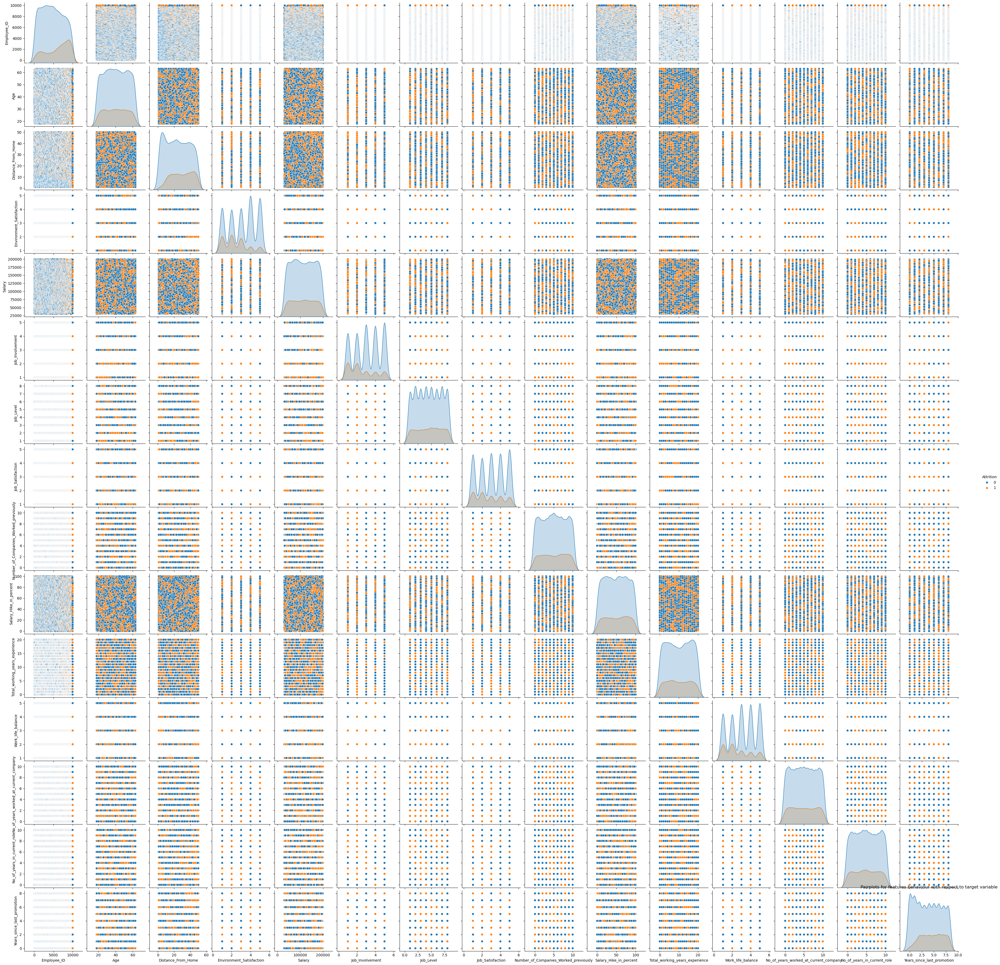

In [53]:
plt.figure(figsize=(15,10))
sns.pairplot(df_c, hue='Attrition')
plt.title('Pairplots for features behaviour with respect to target variable')
plt.show()

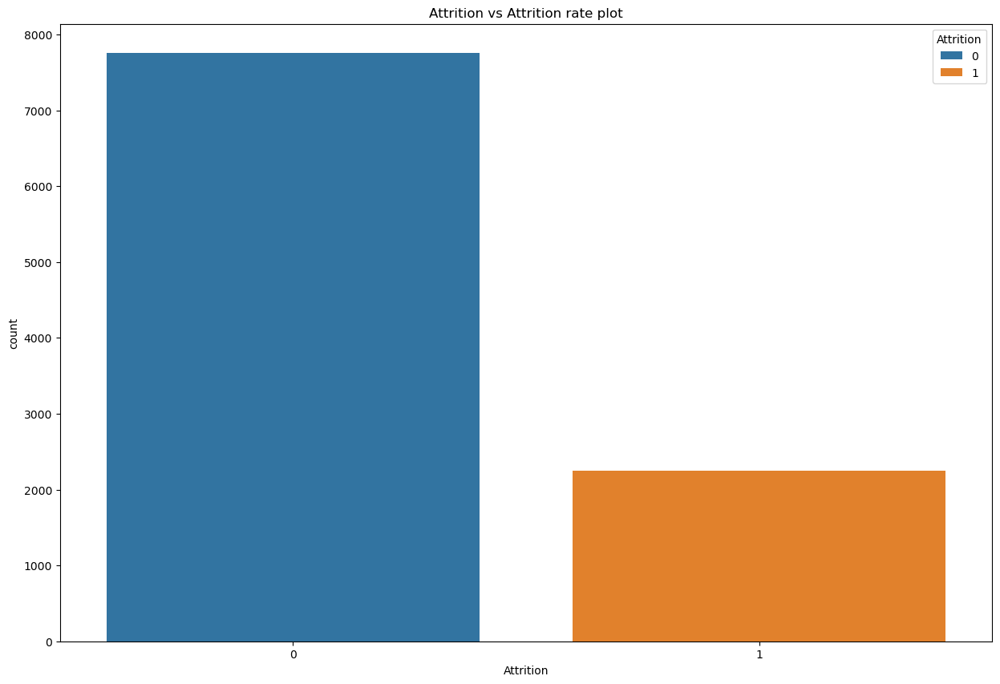

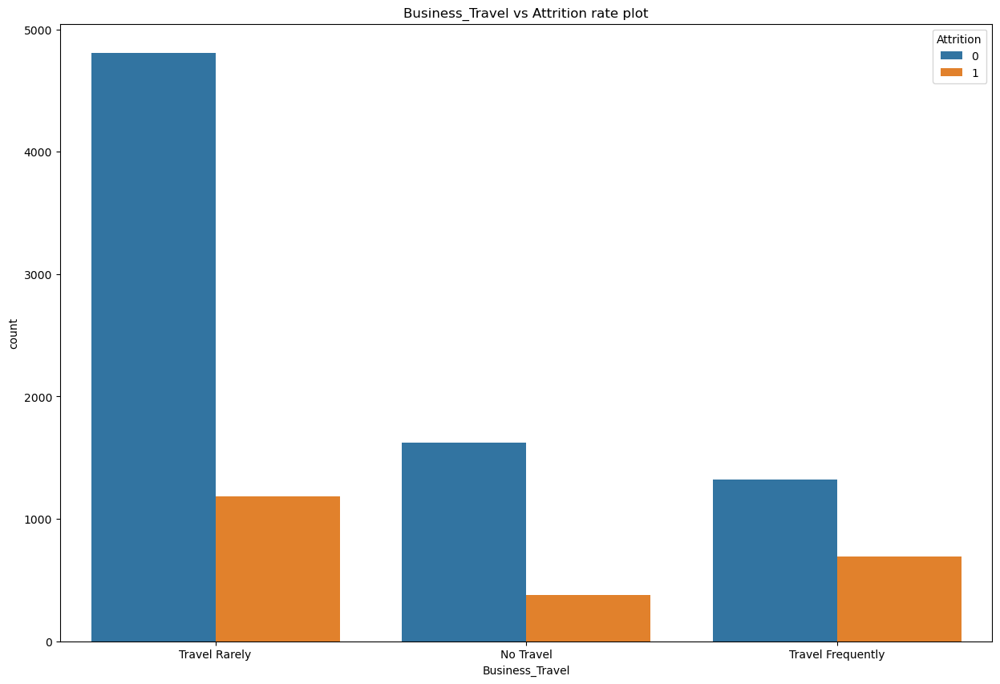

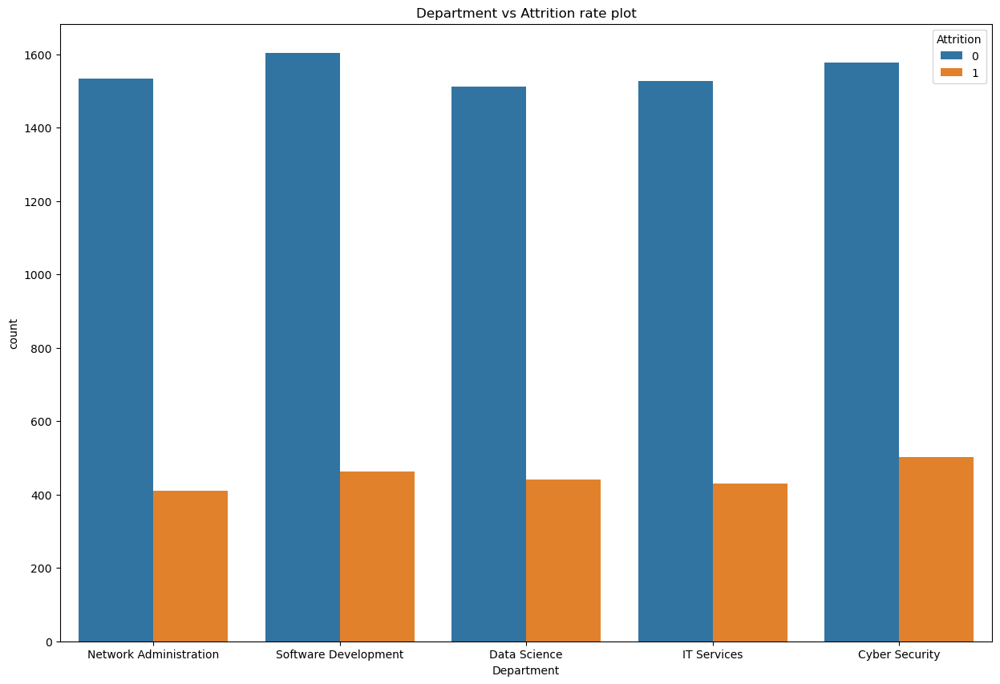

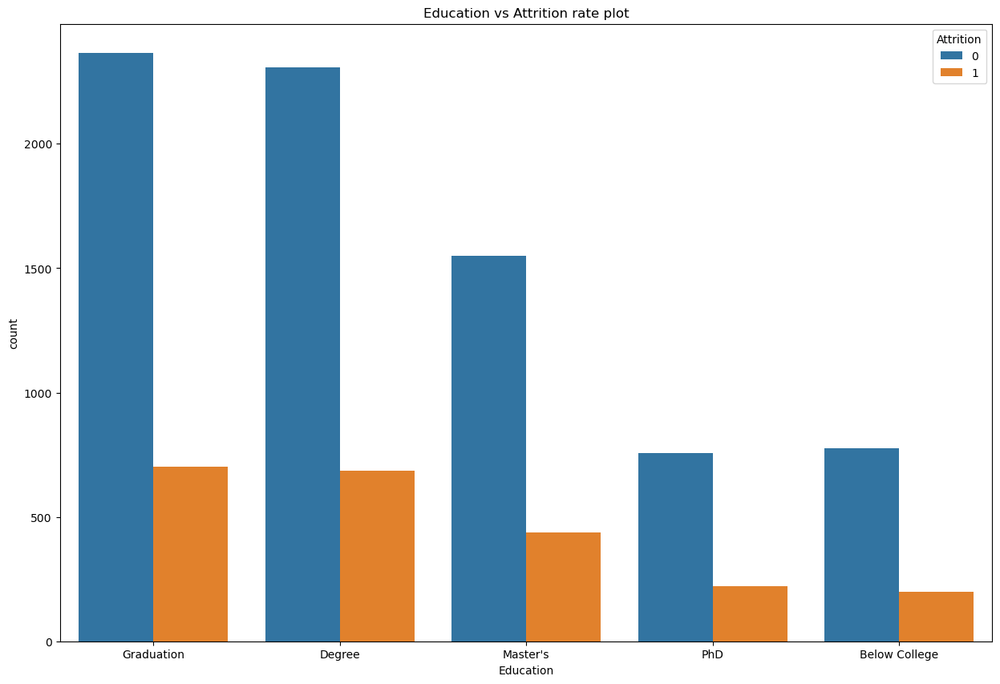

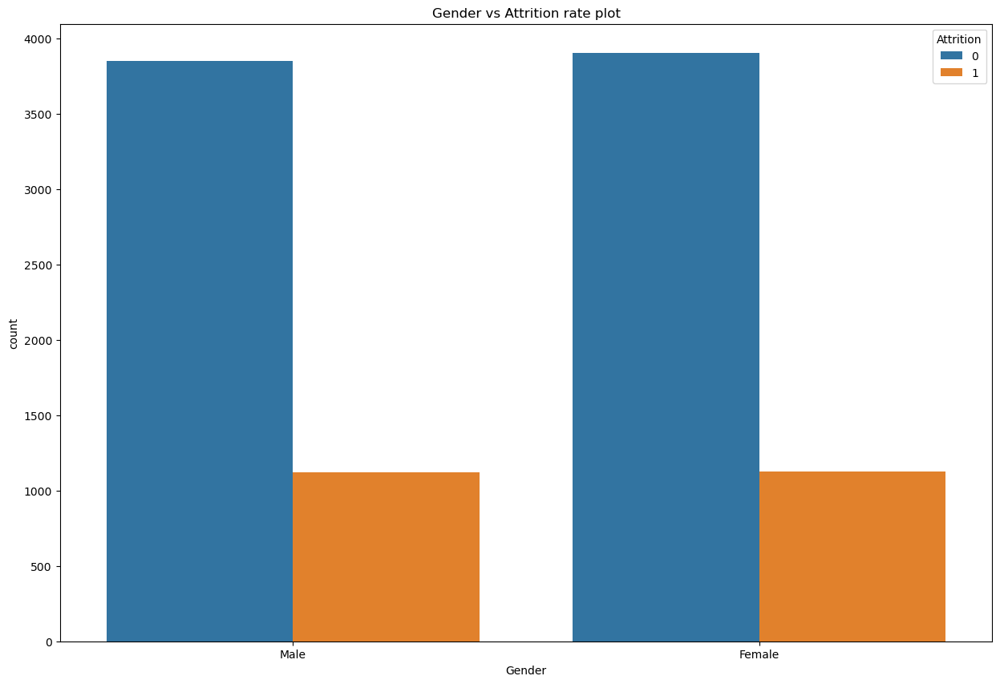

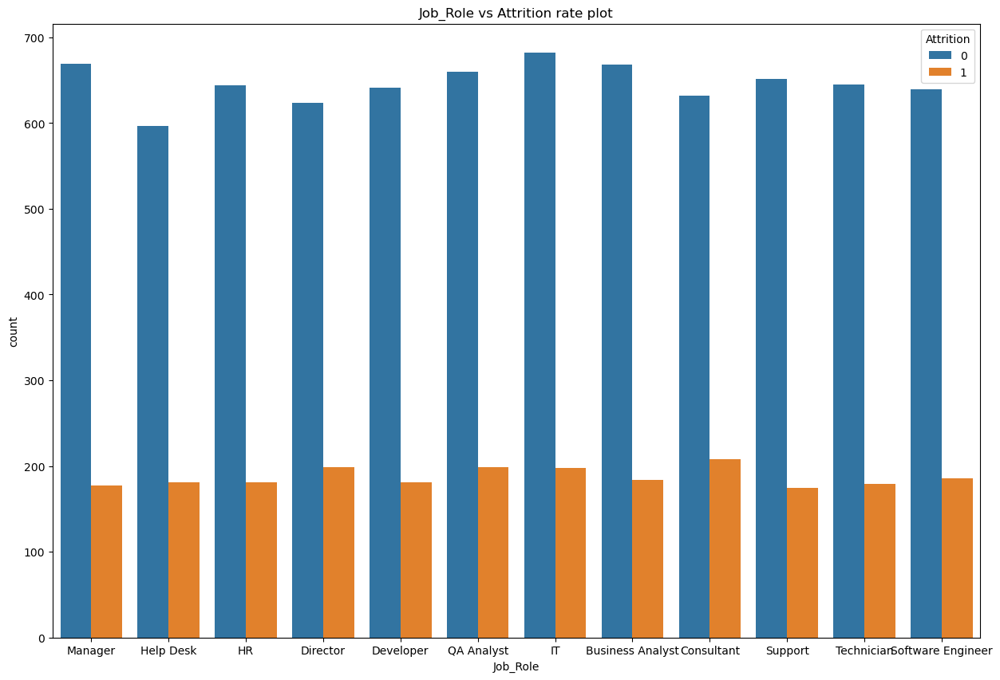

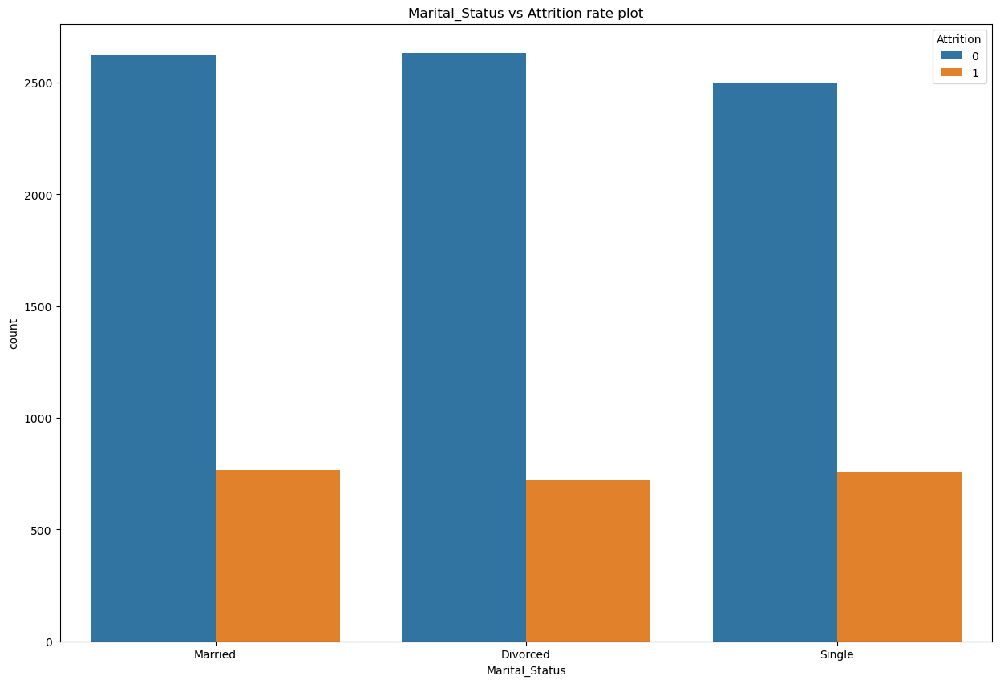

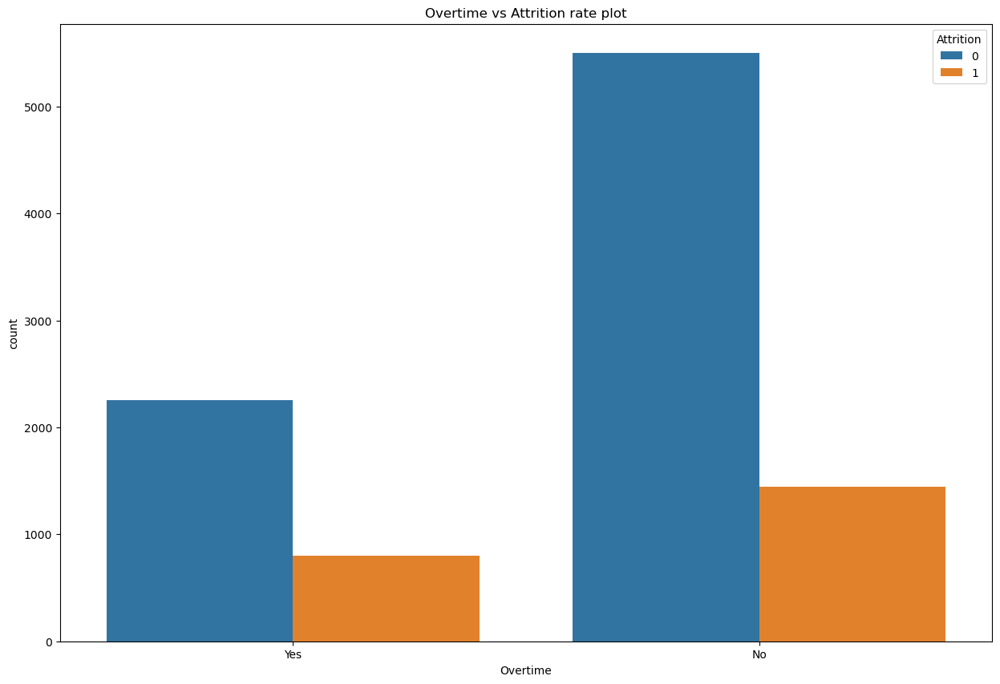

In [54]:
for col in cat_cols:
    plt.figure(figsize=(15, 10))
    sns.categorical.countplot(df_c, x=col, hue='Attrition')
    plt.title(f'{col} vs Attrition rate plot')
    plt.show()

### Employee attrition in the BPO industry refers to the rate at which employees leave an organization, often driven by factors such as job stress, limited career growth, dissatisfaction with work conditions, and availability of better opportunities elsewhere.

### Following exploratory data analysis (EDA) on the employee attrition dataset, it was observed that 77.53% of employees remained with the organization, while 22.47% exhibited attrition, indicating a notable class imbalance favoring non-attrition cases.

### Further analysis identified several key factors strongly associated with higher attrition rates:

## 1) Years Since Last Promotion
#### Employees who had not received a promotion for two or more years showed a significantly higher likelihood of attrition. The attrition rate increased from approximately 10% (0–1 years) to 25% (2+ years), highlighting the importance of career progression.

## 2) Work–Life Balance
#### Attrition rates increased from 16% to 26% among employees who rated their work–life balance between 1 and 3, indicating that poor work–life balance is a strong contributor to employee turnover.

## 3) Environment Satisfaction
#### A clear inverse relationship was observed between environment satisfaction ratings and attrition. Employees reporting lower satisfaction levels were substantially more likely to leave the organization.

## 4) Job Satisfaction and Job Involvement
#### Employees who were less satisfied with their roles or less involved in their work demonstrated higher attrition rates compared to those who reported higher satisfaction and engagement.

## 5) Job Role
#### Attrition was also influenced by job roles, with employees expressing dissatisfaction with their assigned roles being more prone to leaving the organization.

## 6) Distance from Home
#### Employees residing farther from their workplace showed higher attrition tendencies, suggesting a preference for jobs closer to home.

### In addition to these primary drivers, two to three other features exhibited a marginal impact on attrition behavior.

### Finally, the dataset exhibits a significant class imbalance, with non-attrition cases dominating attrition cases. This imbalance must be addressed in subsequent modeling stages to ensure unbiased performance evaluation and robust predictive modeling.

In [55]:
#feature selection 

X = df_c.drop(columns=['Employee_ID', 'Attrition'])
y = df_c[['Attrition']]

In [56]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

In [57]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import SelectKBest, chi2, f_classif, mutual_info_classif
from sklearn.pipeline import Pipeline

In [58]:
num_transformers = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

cat_transformers = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

preprocessor = ColumnTransformer(transformers=[
    ('num', num_transformers, num_cols),
    ('cat', cat_transformers, cat_cols)
])

In [59]:
cat_cols.remove('Attrition')

In [60]:
X_train_prep = preprocessor.fit_transform(X_train)
X_test_prep = preprocessor.transform(X_test)

In [61]:
preprocessor.get_feature_names_out()

array(['num__Age', 'num__Distance_From_Home',
       'num__Environment_Satisfaction', 'num__Salary',
       'num__Job_Involvement', 'num__Job_Level', 'num__Job_Satisfaction',
       'num__Number_of_Companies_Worked_previously',
       'num__Salary_Hike_in_percent',
       'num__Total_working_years_experience', 'num__Work_life_balance',
       'num__No_of_years_worked_at_current_company',
       'num__No_of_years_in_current_role',
       'num__Years_since_last_promotion',
       'cat__Business_Travel_No Travel',
       'cat__Business_Travel_Travel Frequently',
       'cat__Business_Travel_Travel Rarely',
       'cat__Department_Cyber Security', 'cat__Department_Data Science',
       'cat__Department_IT Services',
       'cat__Department_Network Administration',
       'cat__Department_Software Development',
       'cat__Education_Below College', 'cat__Education_Degree',
       'cat__Education_Graduation', "cat__Education_Master's",
       'cat__Education_PhD', 'cat__Gender_Female', 'cat

In [62]:
X_train_prep_df = pd.DataFrame(X_train_prep, columns = preprocessor.get_feature_names_out())

In [63]:
X_train_prep_df.head(1)

,num__Age,num__Distance_From_Home,num__Environment_Satisfaction,num__Salary,num__Job_Involvement,num__Job_Level,num__Job_Satisfaction,num__Number_of_Companies_Worked_previously,num__Salary_Hike_in_percent,num__Total_working_years_experience,num__Work_life_balance,num__No_of_years_worked_at_current_company,num__No_of_years_in_current_role,num__Years_since_last_promotion,cat__Business_Travel_No Travel,cat__Business_Travel_Travel Frequently,cat__Business_Travel_Travel Rarely,cat__Department_Cyber Security,cat__Department_Data Science,cat__Department_IT Services,cat__Department_Network Administration,cat__Department_Software Development,cat__Education_Below College,cat__Education_Degree,cat__Education_Graduation,cat__Education_Master's,cat__Education_PhD,cat__Gender_Female,cat__Gender_Male,cat__Job_Role_Business Analyst,cat__Job_Role_Consultant,cat__Job_Role_Developer,cat__Job_Role_Director,cat__Job_Role_HR,cat__Job_Role_Help Desk,cat__Job_Role_IT,cat__Job_Role_Manager,cat__Job_Role_QA Analyst,cat__Job_Role_Software Engineer,cat__Job_Role_Support,cat__Job_Role_Technician,cat__Marital_Status_Divorced,cat__Marital_Status_Married,cat__Marital_Status_Single,cat__Overtime_No,cat__Overtime_Yes
0,-1.406873,0.244286,0.719263,0.79025,1.421467,1.516629,-1.394762,-1.589856,-1.066009,0.669468,-1.409982,-0.947443,-0.313286,-1.539567,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0


In [64]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier

lg_bal = LogisticRegression(max_iter=2000, 
                            class_weight='balanced', 
                            random_state=42,
                            solver='saga')

lg_unbal = LogisticRegression(max_iter=2000, random_state=42, solver='saga')

final_dt_bal = DecisionTreeClassifier(class_weight='balanced', random_state=42, criterion="log_loss",
                                      max_depth=8, max_leaf_nodes=40, min_samples_leaf=10, min_samples_split=30)
                                      
final_dt_unbal = DecisionTreeClassifier(random_state=42, criterion="log_loss",
                                      max_depth=8, max_leaf_nodes=40, min_samples_leaf=10, min_samples_split=30)

rf_bal = RandomForestClassifier(n_estimators=2000, class_weight='balanced', random_state=42, 
                                criterion='log_loss', max_depth=8, min_samples_split=30, 
                                max_leaf_nodes = 30, max_samples = 0.8,
                                min_samples_leaf = 10)

rf_unbal = RandomForestClassifier(n_estimators=2000, random_state=42, criterion='log_loss', 
                                  max_depth=8, min_samples_split=30, 
                                  max_leaf_nodes = 30, max_samples = 0.8,
                                  min_samples_leaf = 10)

cat_bal = CatBoostClassifier(iterations=2000, learning_rate=0.03, auto_class_weights='SqrtBalanced', depth=5, random_state=42, 
                             cat_features=cat_cols, verbose=False)
cat_unbal = CatBoostClassifier(iterations=2000, learning_rate=0.03, depth=5, random_state=42, cat_features=cat_cols, verbose=False)

In [65]:
lg_bal_pipe = Pipeline(steps=[
    ('preprocessing', preprocessor), 
    ('lg_bal', lg_bal)
])

final_dt_bal_pipe = Pipeline(steps=[
    ('preprocessing', preprocessor), 
    ('dt_bal', final_dt_bal)
])

rf_bal_pipe = Pipeline(steps=[
    ('preprocessing', preprocessor), 
    ('rf_bal', rf_bal)
])
cat_bal.fit(X_train, y_train.values.ravel(), cat_features=cat_cols)

In [66]:
lg_bal_pipe.fit(X_train, y_train.values.ravel())
final_dt_bal_pipe.fit(X_train, y_train.values.ravel())
rf_bal_pipe.fit(X_train, y_train.values.ravel())

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('preprocessing', ...), ('rf_bal', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'drop'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transformers 

In [67]:
r_lg = permutation_importance(lg_bal_pipe, X_test, y_test.values.ravel(), random_state=42, n_jobs=1, scoring='roc_auc')
r_dt = permutation_importance(final_dt_bal_pipe, X_test, y_test.values.ravel(), random_state=42, n_jobs=1, scoring='roc_auc')
r_rf = permutation_importance(rf_bal_pipe, X_test, y_test.values.ravel(), random_state=42, n_jobs=1, scoring='roc_auc')

In [68]:
importances = cat_bal.get_feature_importance()
feature_importance_df = pd.DataFrame({
    "feature": X_train.columns,
    "importance": importances
}).sort_values(by="importance", ascending=False)

features_cat = feature_importance_df.head(15)['feature'].tolist()

In [69]:
feature_importance_lg = pd.DataFrame({
    "feature": X_train.columns,
    "importance": r_lg.importances_mean
}).sort_values(by="importance", ascending=False)

features_lg = feature_importance_lg.head(15)['feature'].tolist()

In [70]:
feature_importance_dt = pd.DataFrame({
    "feature": X_train.columns,
    "importance": r_dt.importances_mean
}).sort_values(by="importance", ascending=False)

features_dt = feature_importance_dt.head(15)['feature'].tolist()

In [71]:
feature_importance_rf = pd.DataFrame({
    "feature": X_train.columns,
    "importance": r_rf.importances_mean
}).sort_values(by="importance", ascending=False)

features_rf = feature_importance_rf.head(15)['feature'].tolist()

In [72]:
common_features = list(set(features_cat) & set(features_lg) & set(features_dt) & set(features_rf))

In [73]:
common_features

['Work_life_balance',
 'Years_since_last_promotion',
 'Distance_From_Home',
 'Job_Involvement',
 'Environment_Satisfaction',
 'Job_Satisfaction',
 'Job_Level',
 'Number_of_Companies_Worked_previously',
 'Business_Travel']

In [74]:
feature_importance_df.to_csv("C:/Users/aksha/employee_attrition_project/feature_importances_cat.csv")
feature_importance_lg.to_csv("C:/Users/aksha/employee_attrition_project/feature_importances_lg.csv")
feature_importance_rf.to_csv("C:/Users/aksha/employee_attrition_project/feature_importances_rf.csv")
feature_importance_dt.to_csv("C:/Users/aksha/employee_attrition_project/feature_importances_dt.csv")